In [1]:
import anndata
import numpy as np
import pandas as pd 
import seaborn as sb
import matplotlib.pyplot as plt
import regex as re
import scanpy as sc

import os,sys,inspect

import warnings
warnings.filterwarnings("ignore")

In [4]:
adata_ref = anndata.read_h5ad('adata_invivo_pseudotime_estimated.h5ad')
adata_query = anndata.read_h5ad('adata_invitro_pseudotime_estimated.h5ad')

adata_query.obs['ANNOTATION'] = adata_query.obs.day
#adata_ref.obs['ANNOTATION'] = adata_ref.obs.fineanno
adata_query.obs['gplvm_pseudotime']  = adata_query.obs['gplvm_pseudotime_cc_excluded']

OSError: Unable to synchronously open file (truncated file: eof = 462499393, sblock->base_addr = 0, stored_eof = 552518438)

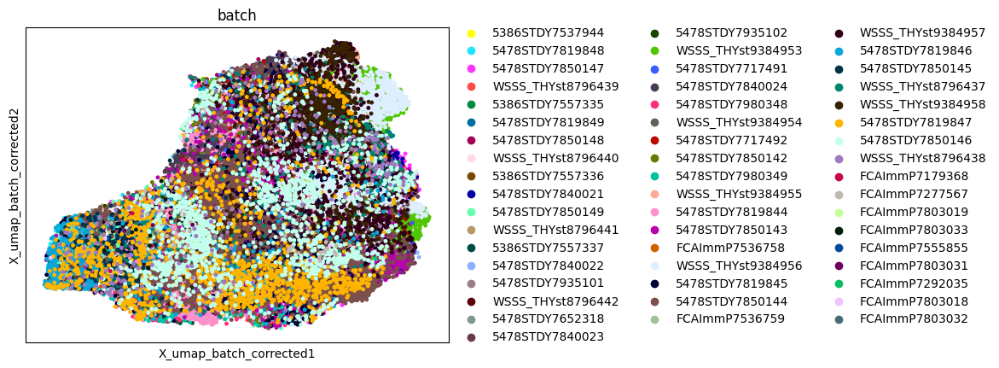

In [60]:
sc.pl.embedding(adata_ref, basis = 'X_umap_batch_corrected', color = ['batch'],s=50)

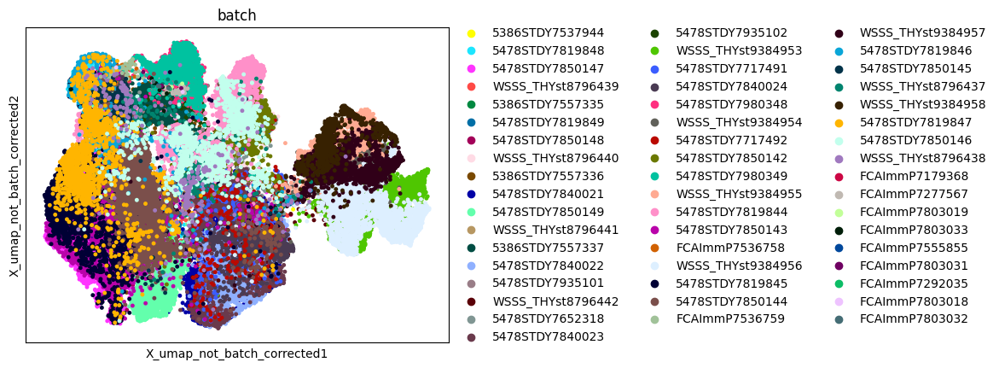

In [61]:
sc.pl.embedding(adata_ref, basis = 'X_umap_not_batch_corrected', color = ['batch'],s=50)

In [67]:
adata_ref.obs

,batch,PCW,percent_mito,nCount_RNA,nFeature_RNA,broadanno,Doublet_score,fineanno,Sequencing,Project,...,palantir_pseudotime_batch_corrected_3,palantir_pseudotime_not_batch_corrected_1,palantir_pseudotime_not_batch_corrected_2,palantir_pseudotime_not_batch_corrected_3,gplvm_pseudotime,gplvm_cc_excluded_pseudotime,ANNOTATION,n_counts,time,bin_ids
AAGGCAGTCTTAGCCC-5386STDY7537944,5386STDY7537944,5.14,0.099270,1005.0,729,Osteochondral,0.311216,Chondroprogenitor,3.0,Limb,...,0.119357,0.445400,0.253465,0.197208,2.397451,2.331288,Chondroprogenitor,1005.0,0.280977,4
AAGTCTGAGTCTCAAC-5386STDY7537944,5386STDY7537944,5.14,0.009451,1532.0,952,Mesenchyme,0.002464,Mesenchymal Condensate 1,3.0,Limb,...,0.021519,0.637360,0.356784,0.291147,-0.092232,1.074192,Mesenchymal Condensate 1,1532.0,0.125942,2
AATCCAGTCTCGCTTG-5386STDY7537944,5386STDY7537944,5.14,0.004641,3168.0,1600,Osteochondral,0.019318,Chondroprogenitor,3.0,Limb,...,0.140603,0.689613,0.418146,0.334520,2.557576,2.366405,Chondroprogenitor,3168.0,0.285308,4
ACGATGTCACGAGGTA-5386STDY7537944,5386STDY7537944,5.14,0.078386,662.0,522,Osteochondral,0.010468,Chondroprogenitor,3.0,Limb,...,0.067682,0.550581,0.307176,0.240036,2.433438,2.353452,Chondroprogenitor,662.0,0.283710,4
ACTGATGAGGGTCTCC-5386STDY7537944,5386STDY7537944,5.14,0.004448,2614.0,1407,Osteochondral,0.051243,Chondroprogenitor,3.0,Limb,...,0.053793,0.634352,0.357147,0.297638,2.551812,2.641311,Chondroprogenitor,2614.0,0.319211,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AAACCTGCATTGTGCA-FCAImmP7803032,FCAImmP7803032,14.00,0.037218,11357.0,3423,Osteochondral,0.087293,Prehypertrophic CC,5.0,Marrow,...,0.286351,0.911934,0.662484,0.575768,7.209476,6.870145,Prehypertrophic CC,11357.0,0.840745,11
CATGACAAGGTGATTA-FCAImmP7803032,FCAImmP7803032,14.00,0.029763,14768.0,3908,Osteochondral,0.059749,Resting CC,5.0,Marrow,...,0.073315,0.862077,0.591698,0.533848,5.513070,5.483918,Resting CC,14768.0,0.669785,9
CCAGCGATCCACTGGG-FCAImmP7803032,FCAImmP7803032,14.00,0.037399,4998.0,1951,Osteochondral,0.021751,Resting CC,5.0,Marrow,...,0.242857,0.911684,0.648420,0.564979,6.443792,6.979533,Resting CC,4998.0,0.854236,12
TCAATCTGTAGCTAAA-FCAImmP7803032,FCAImmP7803032,14.00,0.047580,14461.0,3841,Osteochondral,0.026716,Resting CC,5.0,Marrow,...,0.241400,0.906107,0.647772,0.560948,6.383491,5.954885,Resting CC,14461.0,0.727868,10


In [3]:
#sc.pl.violin(adata_query, 
#             keys=["gplvm_pseudotime","gplvm_pseudotime_cc_excluded"], 
#             groupby="ANNOTATION", rotation=30) 

In [28]:
#adata_ref.obs['ANNOTATION'] = np.array(adata_ref.obs.fineanno, dtype=str)

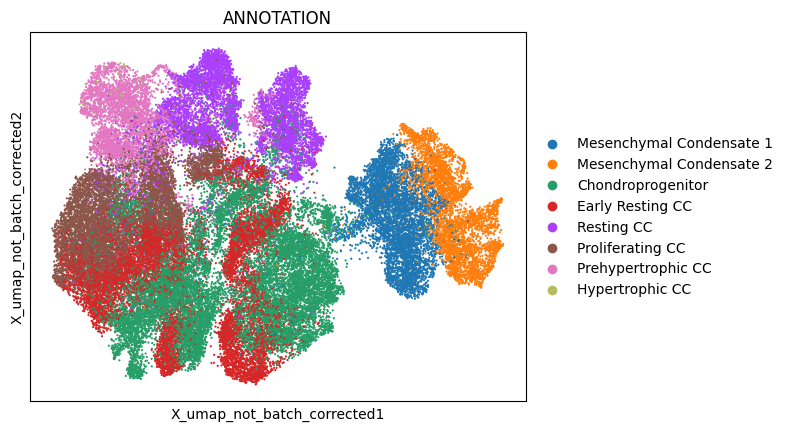

In [29]:
# without data reduction -- batch not corrected 
sc.pl.embedding(adata_ref, basis='X_umap_not_batch_corrected', color=['ANNOTATION'], s=10)

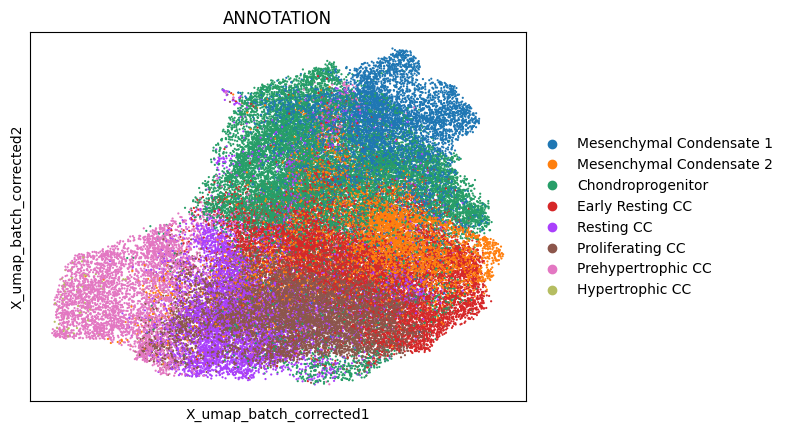

In [30]:
sc.pl.embedding(adata_ref, basis='X_umap_batch_corrected', color=['ANNOTATION','gplvm_pseudotime'], s=20,save='figures/cellrank_umap_proj_TI_primary.pdf')

In [31]:
adata_ref

AnnData object with n_obs × n_vars = 55659 × 36335
    obs: 'batch', 'PCW', 'percent_mito', 'nCount_RNA', 'nFeature_RNA', 'broadanno', 'Doublet_score', 'fineanno', 'Sequencing', 'Project', 'SANGER.TUBE.ID', 'SUPPLIER.SAMPLE.NAME', 'finestanno', 'ID', 'palantir_pseudotime_batch_corrected_1', 'palantir_pseudotime_batch_corrected_2', 'palantir_pseudotime_batch_corrected_3', 'palantir_pseudotime_not_batch_corrected_1', 'palantir_pseudotime_not_batch_corrected_2', 'palantir_pseudotime_not_batch_corrected_3', 'gplvm_pseudotime', 'gplvm_cc_excluded_pseudotime', 'ANNOTATION'
    uns: 'ANNOTATION_colors', 'fineanno_colors'
    obsm: 'X_gplvm', 'X_gplvm_cc_excluded', 'X_scVI_batch_corrected', 'X_scVI_not_batch_corrected', 'X_umap_batch_corrected', 'X_umap_not_batch_corrected'
    layers: 'counts'

In [ ]:
sc.pl.violin(adata_ref, keys=["gplvm_pseudotime","palantir_pseudotime_not_batch_corrected_2"], groupby="ANNOTATION", rotation=30) 

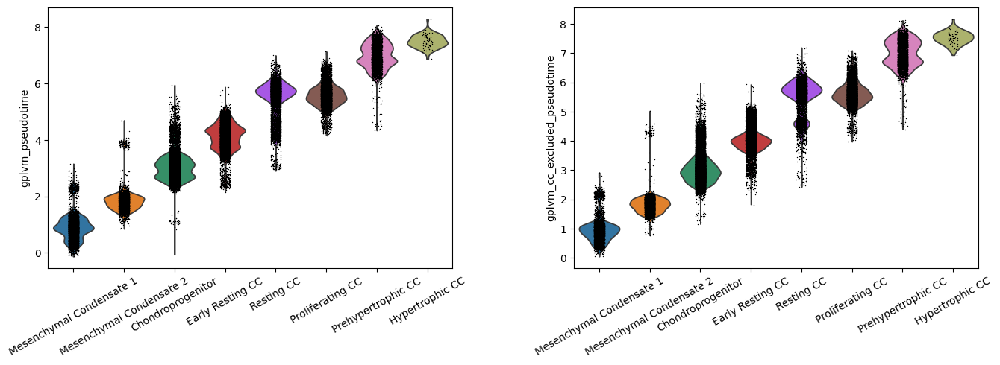

In [33]:
sc.pl.violin(adata_ref, keys=["gplvm_pseudotime","gplvm_cc_excluded_pseudotime"], groupby="ANNOTATION", rotation=30) 

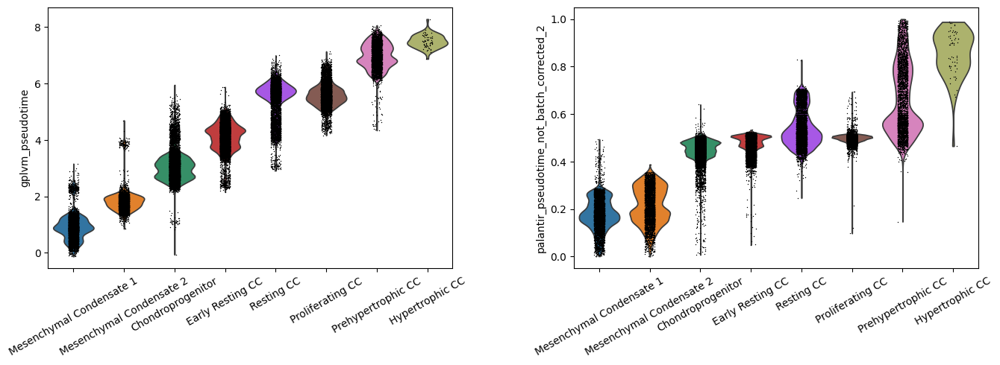

In [38]:
sc.pl.violin(adata_ref, keys=["gplvm_pseudotime","palantir_pseudotime_not_batch_corrected_2"], groupby="ANNOTATION", rotation=30) 

In [6]:
print(adata_ref.shape)
print(adata_ref.X.data)
print(adata_query.shape)
print(adata_query.X.data)

(55659, 36335)
[1. 1. 1. ... 1. 1. 1.]
(20179, 25719)
[1. 1. 1. ... 1. 1. 1.]


In [9]:
adata_ref

AnnData object with n_obs × n_vars = 55659 × 36335
    obs: 'batch', 'PCW', 'percent_mito', 'nCount_RNA', 'nFeature_RNA', 'broadanno', 'Doublet_score', 'fineanno', 'Sequencing', 'Project', 'SANGER.TUBE.ID', 'SUPPLIER.SAMPLE.NAME', 'finestanno', 'ID', 'palantir_pseudotime_batch_corrected_1', 'palantir_pseudotime_batch_corrected_2', 'palantir_pseudotime_batch_corrected_3', 'palantir_pseudotime_not_batch_corrected_1', 'palantir_pseudotime_not_batch_corrected_2', 'palantir_pseudotime_not_batch_corrected_3', 'gplvm_pseudotime', 'gplvm_cc_excluded_pseudotime', 'ANNOTATION'
    uns: 'ANNOTATION_colors', 'fineanno_colors'
    obsm: 'X_gplvm', 'X_gplvm_cc_excluded', 'X_scVI_batch_corrected', 'X_scVI_not_batch_corrected', 'X_umap_batch_corrected', 'X_umap_not_batch_corrected'
    layers: 'counts'

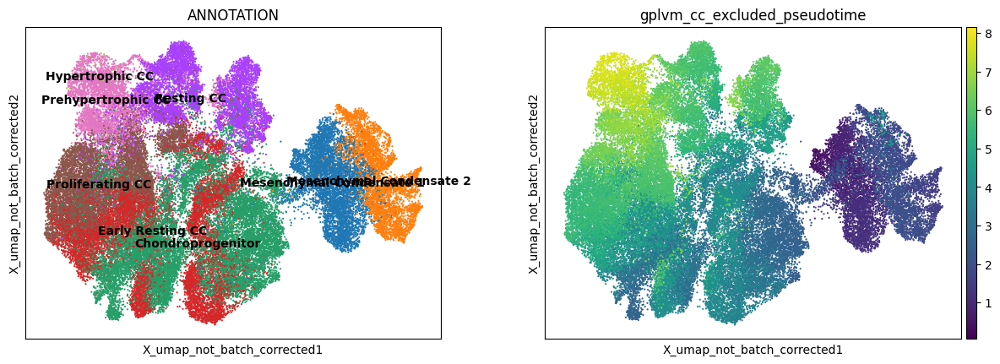

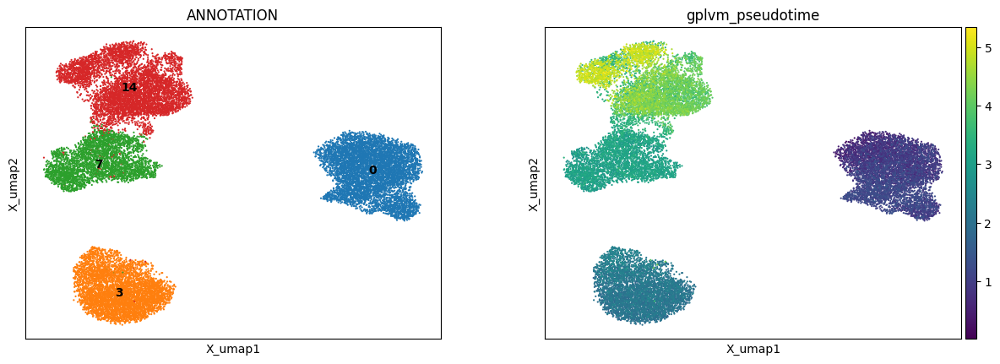

In [10]:
sc.pl.embedding(adata_ref, basis='X_umap_not_batch_corrected', color=['ANNOTATION','gplvm_cc_excluded_pseudotime'], legend_loc='on data',s=10)
sc.pl.embedding(adata_query,basis='X_umap', color=['ANNOTATION','gplvm_pseudotime'], legend_loc='on data',s=10)

In [19]:
adata_ref.obs['ANNOTATION'] = np.asarray(adata_ref.obs.ANNOTATION)
cc = ['Mesenchymal Condensate 1', 'Mesenchymal Condensate 2', 'Chondroprogenitor',  'Early Resting CC', 'Resting CC',
 'Proliferating CC',  'Prehypertrophic CC', 'Hypertrophic CC']
adata_ref.obs['ANNOTATION'] = pd.Categorical(adata_ref.obs['ANNOTATION'], categories=cc, ordered=True)

In [20]:
len(np.unique(adata_query.obs.run))

2

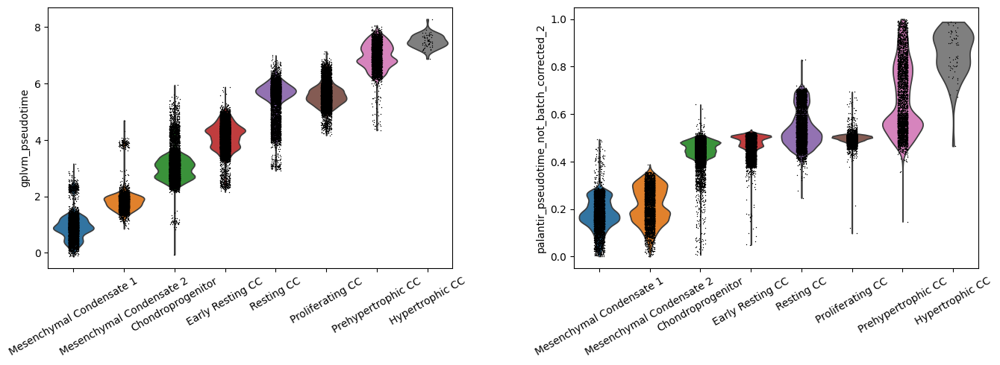

In [21]:
sc.pl.violin(adata_ref, keys=["gplvm_pseudotime","palantir_pseudotime_not_batch_corrected_2"], groupby="ANNOTATION", rotation=30) 

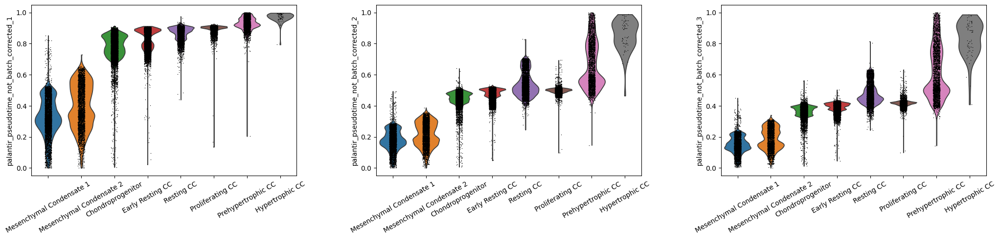

In [22]:
sc.pl.violin(adata_ref, keys=["palantir_pseudotime_not_batch_corrected_1",
                              "palantir_pseudotime_not_batch_corrected_2",
                             "palantir_pseudotime_not_batch_corrected_3"], 
             groupby="ANNOTATION", rotation=30) 

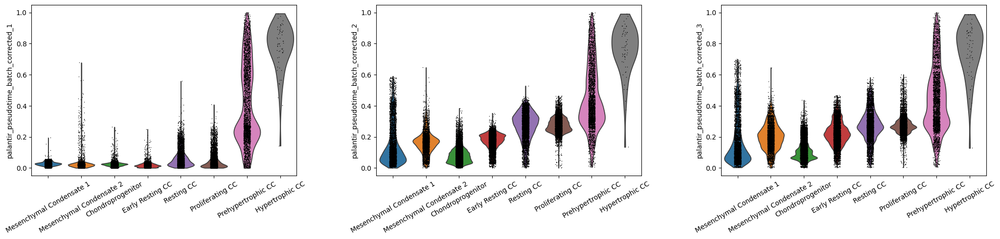

In [23]:
sc.pl.violin(adata_ref, keys=["palantir_pseudotime_batch_corrected_1",
                              "palantir_pseudotime_batch_corrected_2",
                             "palantir_pseudotime_batch_corrected_3"], 
             groupby="ANNOTATION", rotation=30) 

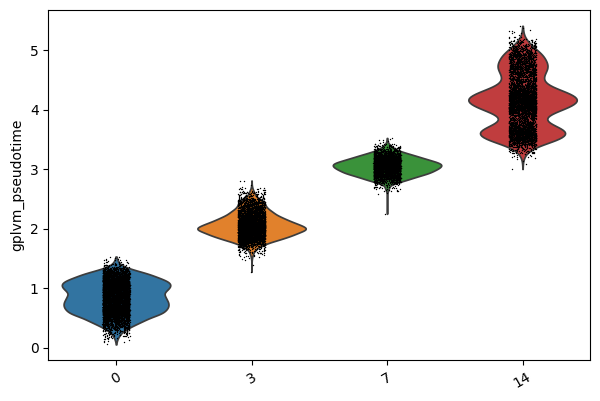

In [9]:
sc.pl.violin(adata_query, keys=["gplvm_pseudotime"], groupby="ANNOTATION", rotation=30) 

# Genes2Genes runs

In [2]:
# loading aligner objects saved from below runs:
import pickle

with open('aligner_TF_secondrun.pkl', 'rb') as f:
    aligner = pickle.load(f)



In [2]:
import pickle

with open('aligner_hvgs.pkl', 'rb') as f:
    aligner_hvgs = pickle.load(f)

Mean alignment similarity percentage (matched %): 
53.28000000000001 %


,Gene,alignment_similarity_percentage,opt_alignment_cost,l2fc,color,abs_l2fc
685,WFDC2,0.0,67.468115,7.961677,red,7.961677
297,HOXA10,0.0,67.468115,7.362309,red,7.362309
370,LIMCH1,0.0,67.468115,7.145821,red,7.145821
84,BEX2,0.0,67.468115,6.345318,red,6.345318
590,SLC40A1,0.0,67.468115,6.12841,red,6.12841
...,...,...,...,...,...,...
697,ZSWIM1,1.0,4.248906,0.287325,green,0.287325
187,DISP2,1.0,9.967389,-0.24097,green,0.24097
502,PLP1,1.0,4.937377,0.115169,green,0.115169
589,SLC39A8,1.0,5.399582,0.075898,green,0.075898


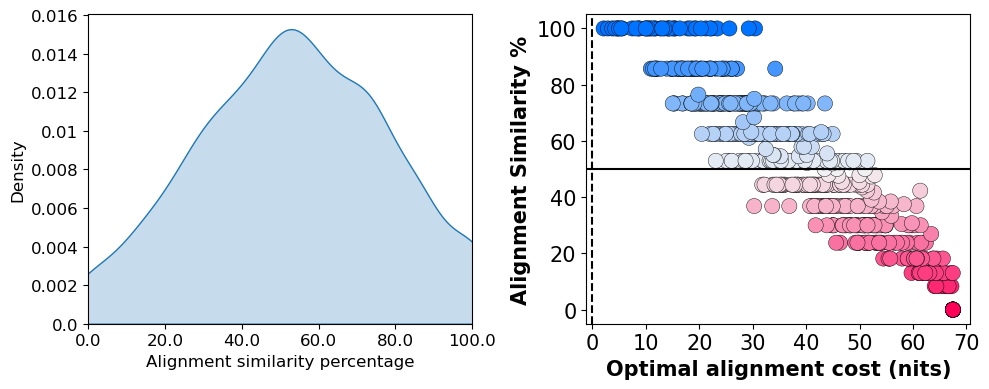

In [4]:
df = aligner_hvgs.get_stat_df() # ordered genes according to alignment similarity statistics 
df

In [5]:
#write this
df.to_csv("hvg_similarities_revision.csv")

In [2]:
pip install git+https://github.com/Teichlab/Genes2Genes.git

  Cloning https://github.com/Teichlab/Genes2Genes.git to /tmp/pip-req-build-tnqui2c7
  Running command git clone --filter=blob:none --quiet https://github.com/Teichlab/Genes2Genes.git /tmp/pip-req-build-tnqui2c7
  Resolved https://github.com/Teichlab/Genes2Genes.git to commit e3d865cbb5b3d4a5b25b885b22ffb164d3c64768
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 626.3/626.3 kB 10.3 MB/s eta 0:00:0000:01
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Obtaining dependency information for nose from https://files.pythonhosted.org/packages/15/d8/dd071918c040f50fa1cf80da16423af51ff8ce4a0f2399b7bf8de45ac3d9/nose-1.3.7-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.7/154.7 kB 3.8 MB/s eta 0:00:00:00:01
  Created wheel for genes2genes: filename=genes2genes-0.2.0-py3-none-any.whl size=41604 sha256=838e8

In [3]:
from genes2genes import Main
from genes2genes import ClusterUtils
from genes2genes import TimeSeriesPreprocessor
from genes2genes import PathwayAnalyser
from genes2genes import VisualUtils



<Axes: xlabel='palantir_pseudotime_not_batch_corrected_2', ylabel='Density'>

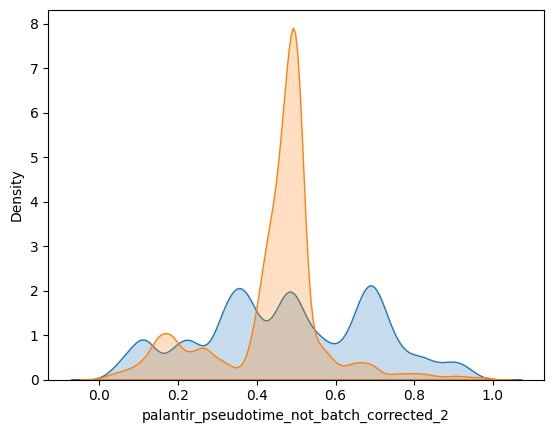

In [5]:
sb.kdeplot(TimeSeriesPreprocessor.Utils.minmax_normalise(np.asarray(adata_ref.obs['gplvm_cc_excluded_pseudotime'])), fill=True)
sb.kdeplot(adata_ref.obs.palantir_pseudotime_not_batch_corrected_2, fill=True)

In [6]:
print(adata_ref.shape)
print(adata_query.shape)
print(adata_ref.X.data)
print(adata_query.X.data)
max(adata_ref.X.data)

(55659, 36335)
(20179, 25719)
[1. 1. 1. ... 1. 1. 1.]
[1. 1. 1. ... 1. 1. 1.]


3356.0

In [7]:
adata_ref.raw = adata_ref.copy()
adata_query.raw = adata_query.copy()

In [8]:
common_genes = np.intersect1d(adata_query.var_names, adata_ref.var_names)
a = ['STAT3', 'FOXP1', 'NKX3-2', 'HMGA2', 'SOX9', 'SOX6', 'KLF4', 'KLF2']
c = ['LRP4', 'SPP1', 'COL1A1', 'ALPL', 'ACTA2', 'SP7', 'PITX1', 'CFAP298','THBS2','FOXO1']
b=  ['ACAN','COL2A1','COL9A1','EPYC','COL9A2','MATN1','MATN3','IHH','COL9A3','MATN4']
genes2test = np.intersect1d(a+b+c, common_genes)

In [9]:
len(genes2test)

28

In [10]:
# genes more than 10 cells expressed 
#ref_genes = adata_ref[:,sc.pp.filter_genes(adata_ref, min_cells=10,inplace=False)[0]].var_names
#query_genes = adata_query[:,sc.pp.filter_genes(adata_query, min_cells=10,inplace=False)[0]].var_names

In [11]:
print(adata_ref.shape)
print(adata_query.shape)

(55659, 36335)
(20179, 25719)


In [12]:
#sc.pp.filter_genes(adata_ref, min_cells=10,inplace=False)
sc.pp.normalize_per_cell(adata_ref, 10000) 
sc.pp.log1p(adata_ref)
#sc.pp.filter_genes(adata_query, min_cells=10)
sc.pp.normalize_per_cell(adata_query, 10000) 
sc.pp.log1p(adata_query)

In [13]:
print(adata_ref.shape)
print(adata_query.shape)

(55659, 36335)
(20179, 25719)


In [14]:
sc.pp.highly_variable_genes(adata_ref, subset=False)
sc.pp.highly_variable_genes(adata_query, subset=False)
ref_genes = adata_ref.var_names[adata_ref.var['highly_variable']]
query_genes = adata_query.var_names[adata_query.var['highly_variable']]
hvg_genes = np.intersect1d(ref_genes, query_genes)
len(hvg_genes)

699

In [15]:
common_genes = np.intersect1d(adata_query.var_names, adata_ref.var_names)
def get_human_TF_list(): 
    # get a human TF list 
    TF_list = pd.read_csv('huamn_TF_list.csv',skiprows=1)
    np.unique(TF_list['Unnamed: 3'], return_counts=True) # There are only 1639 true TFs out of 2765 TFs in this list 
    TF_list = TF_list[TF_list['Unnamed: 3']=='Yes']
    TF_list['Name']
    return TF_list
human_TFs = get_human_TF_list()
human_TFs = np.intersect1d(common_genes , np.asarray(human_TFs['Name']) )
len(human_TFs)

1442

In [16]:
print(adata_ref.shape)
print(adata_query.shape)
print(adata_ref.X.data)
print(adata_query.X.data)
max(adata_ref.X.data)

(55659, 36335)
(20179, 25719)
[1.21281826 1.06435707 0.96426141 ... 1.67457253 1.16747232 0.74337549]
[1.25544801 1.13167315 0.49014387 ... 2.46901528 1.81204414 1.29176904]


8.530417850231082

### 1442 TFs and 699 HVGs to test

In [17]:
print(len(hvg_genes))
print(len(human_TFs))

699
1442


In [18]:
print(adata_ref.shape)
print(adata_query.shape)
print(adata_ref.X.data)
print(adata_query.X.data)

(55659, 36335)
(20179, 25719)
[1.21281826 1.06435707 0.96426141 ... 1.67457253 1.16747232 0.74337549]
[1.25544801 1.13167315 0.49014387 ... 2.46901528 1.81204414 1.29176904]


In [19]:
adata_ref

AnnData object with n_obs × n_vars = 55659 × 36335
    obs: 'batch', 'PCW', 'percent_mito', 'nCount_RNA', 'nFeature_RNA', 'broadanno', 'Doublet_score', 'fineanno', 'Sequencing', 'Project', 'SANGER.TUBE.ID', 'SUPPLIER.SAMPLE.NAME', 'finestanno', 'ID', 'palantir_pseudotime_batch_corrected_1', 'palantir_pseudotime_batch_corrected_2', 'palantir_pseudotime_batch_corrected_3', 'palantir_pseudotime_not_batch_corrected_1', 'palantir_pseudotime_not_batch_corrected_2', 'palantir_pseudotime_not_batch_corrected_3', 'gplvm_pseudotime', 'gplvm_cc_excluded_pseudotime', 'ANNOTATION', 'n_counts'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'ANNOTATION_colors', 'fineanno_colors', 'log1p', 'hvg'
    obsm: 'X_gplvm', 'X_gplvm_cc_excluded', 'X_scVI_batch_corrected', 'X_scVI_not_batch_corrected', 'X_umap_batch_corrected', 'X_umap_not_batch_corrected'
    layers: 'counts'

In [20]:
adata_ref.obs['time'] = TimeSeriesPreprocessor.Utils.minmax_normalise(np.asarray(adata_ref.obs['gplvm_cc_excluded_pseudotime']))
adata_query.obs['time'] = TimeSeriesPreprocessor.Utils.minmax_normalise(np.asarray(adata_query.obs['gplvm_pseudotime']))

In [21]:
print(min(adata_ref.obs['time']), max(adata_ref.obs['time']))
print(min(adata_query.obs['time']), max(adata_query.obs['time']))

0.0 1.0
0.0 1.0


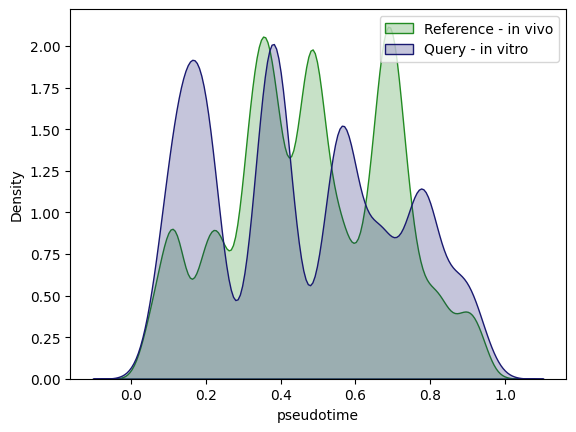

In [22]:
# Visualize the pseudotime distributions
sb.kdeplot(adata_ref.obs['time'], fill=True, label='Reference - in vivo', color='forestgreen') 
sb.kdeplot(adata_query.obs['time'], fill=True, label='Query - in vitro', color='midnightblue'); 
plt.xlabel('pseudotime'); plt.legend(); plt.show()

In [23]:
import optbinning
optbinning.__version__

(CVXPY) Aug 08 10:10:10 AM: Encountered unexpected exception importing solver GLOP:
RuntimeError('Unrecognized new version of ortools (9.10.4067). Expected < 9.10.0. Please open a feature request on cvxpy to enable support for this version.')
(CVXPY) Aug 08 10:10:10 AM: Encountered unexpected exception importing solver PDLP:
RuntimeError('Unrecognized new version of ortools (9.10.4067). Expected < 9.10.0. Please open a feature request on cvxpy to enable support for this version.')


'0.19.0'

In [24]:
from optbinning import ContinuousOptimalBinning

x = np.asarray(adata_ref.obs.time)
optb = ContinuousOptimalBinning(name='pseudotime', dtype="numerical")
optb.fit(x, x)
print(len(optb.splits))

x = np.asarray(adata_query.obs.time)
optb = ContinuousOptimalBinning(name='pseudotime', dtype="numerical")
optb.fit(x, x)
print(len(optb.splits))

13
13


In [25]:
n_bins = 13

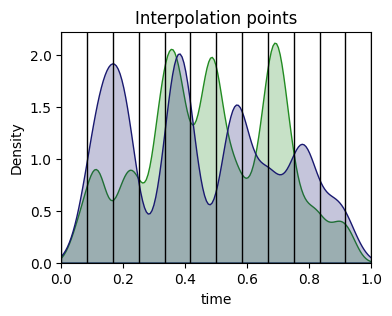

In [26]:
VisualUtils.plot_pseudotime_dists_with_interpolation_points(adata_ref, adata_query, n_bins)

In [27]:
joint_cmap = {
'Stem':'#f7b6d2',
'TA': '#dbdb8d',
'E Enterocyte 1': '#bcbd22',
'E Enterocyte 2': '#17becf',
'E Enterocyte 3': '#aec7e8',
'Enterocyte': '#ffbb78',
'E Colonocyte 1': '#9467bd',
'E Colonocyte 2': '#e377c2',
'Colonocyte': '#2ca02c'
}

In [28]:
joint_cmap = {}
colors = np.asarray(sb.color_palette('tab20').as_hex()) 
i=0
for c in np.unique(adata_ref.obs.fineanno):
    joint_cmap[c] = colors[i]
    i+=1
    
for c in np.unique(adata_query.obs.day):
    joint_cmap[c] = colors[i]
    i+=1

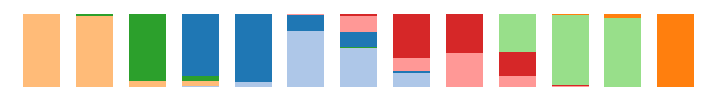

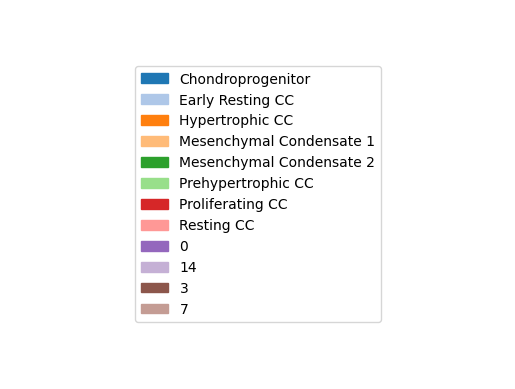

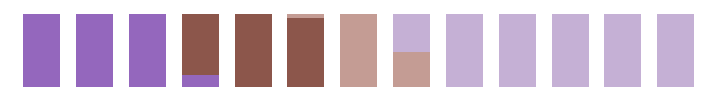

In [29]:
VisualUtils.plot_celltype_barplot(adata_ref, n_bins, 'fineanno', joint_cmap=joint_cmap)
VisualUtils.plot_any_legend(joint_cmap)
VisualUtils.plot_celltype_barplot(adata_query, n_bins, 'day', joint_cmap=joint_cmap)

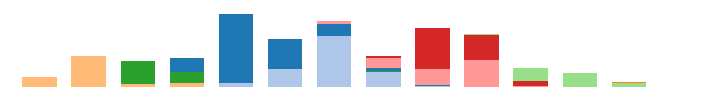

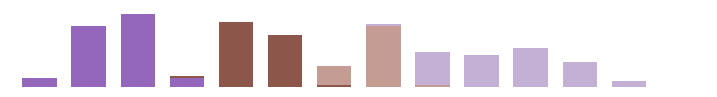

In [30]:
VisualUtils.plot_celltype_barplot(adata_ref, n_bins+1, 'fineanno', joint_cmap=joint_cmap, plot_cell_counts=True, )
VisualUtils.plot_celltype_barplot(adata_query, n_bins+1, 'day', joint_cmap=joint_cmap, plot_cell_counts=True)

In [31]:
aligner = Main.RefQueryAligner(adata_ref, adata_query, human_TFs, n_bins) 
aligner.align_all_pairs() 

Genes2Genes (v0.2.0)
Dynamic programming alignment of gene pseudotime trajectories using a bayesian information-theoretic framework
Interpolator initialization completed
Aligner initialised to align trajectories of 55659 reference cells & 20179 query cells in terms of 1442 genes
Running gene-level alignment: 🧬


100%|██████████| 1442/1442 [09:06<00:00,  2.64it/s]

Alignment completed! ✅


Average Alignment:  IDMMMMMMMMMMMID (cell-level)
% similarity: 73.33


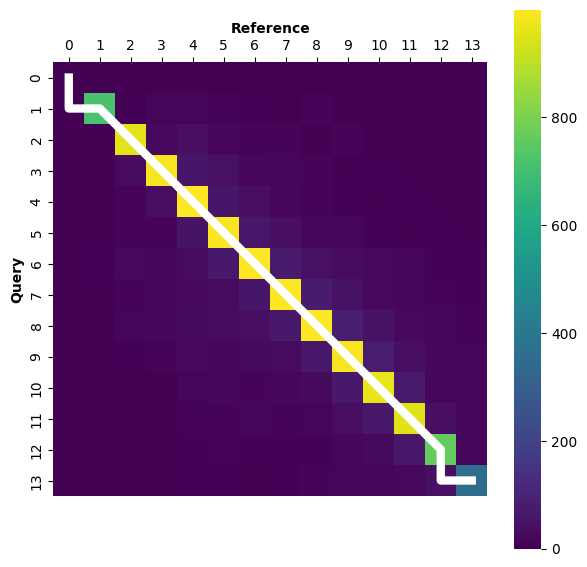

In [32]:
aligner.get_aggregate_alignment()

Mean alignment similarity percentage (matched %): 
67.0 %


,Gene,alignment_similarity_percentage,opt_alignment_cost,l2fc,color,abs_l2fc
126,DMRTA2,0.0,67.468115,inf,red,inf
202,FOXD4,0.0,67.468115,inf,red,inf
290,HLF,0.0,67.468115,inf,red,inf
299,HMX3,0.0,67.468115,inf,red,inf
304,HOXA1,0.0,67.468115,inf,red,inf
...,...,...,...,...,...,...
555,OVOL2,1.0,-2.402765,0.007483,green,0.007483
1003,ZNF223,1.0,3.591057,0.002902,green,0.002902
1386,ZNF813,1.0,5.263254,0.001111,green,0.001111
488,NEUROD6,1.0,-1.188767,NaN,green,NaN


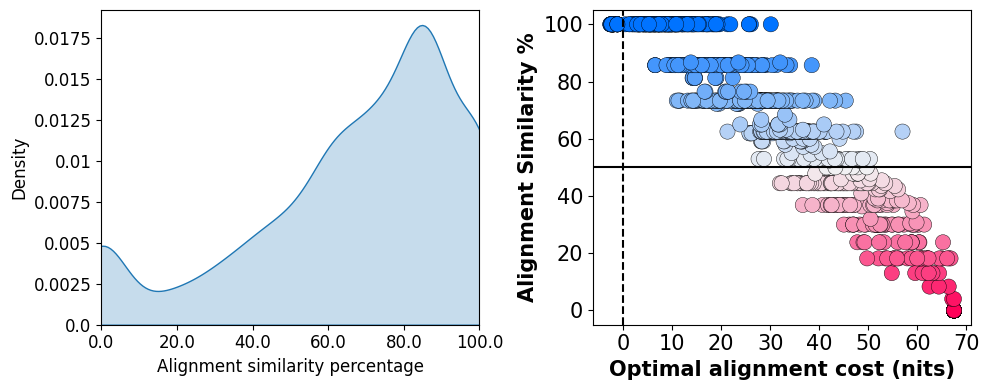

In [33]:
df = aligner.get_stat_df() # ordered genes according to alignment similarity statistics 
df

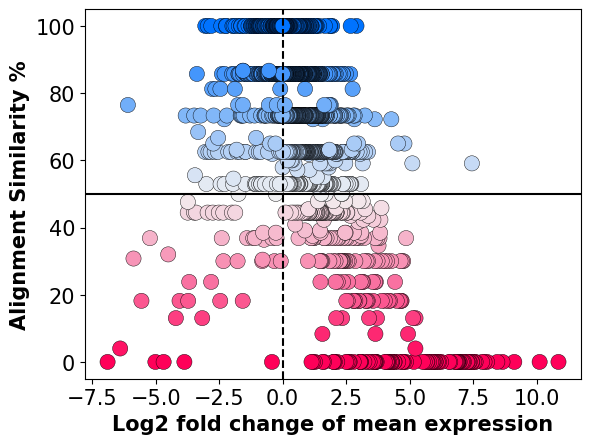

In [34]:


VisualUtils.plot_alignmentSim_vs_l2fc(df)



In [35]:
threshold_similarity = 0.3 
topDEgenes = df[list(df['alignment_similarity_percentage'] <=threshold_similarity)]['Gene']
# Calling wrapper function for GSEAPy enrichr inferface
pathway_df = PathwayAnalyser.run_overrepresentation_analysis(topDEgenes) 
pathway_df.head(5)


,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,-log10 Adjusted P-value,-log10 FDR q-val
0,MSigDB_Hallmark_2020,TNF-alpha Signaling via NF-kB,20/200,1.168853e-14,4.324758e-13,0,0,12.179392,390.716932,KLF10;TGIF1;EGR1;EGR2;JUN;EGR3;TSC22D1;FOS;KLF...,12.364038,12.364038
37,KEGG_2021_Human,Transcriptional misregulation in cancer,15/192,9.055065e-10,1.059443e-07,0,0,9.038320,188.200656,SPI1;ZBTB16;HMGA2;PAX3;ETV1;PBX1;ETV5;HOXA11;H...,6.974923,6.974923
38,KEGG_2021_Human,Maturity onset diabetes of the young,6/26,1.754927e-07,7.700843e-06,0,0,30.747668,478.300525,HHEX;HNF4G;HES1;HNF1A;FOXA3;FOXA2,5.113462,5.113462
39,KEGG_2021_Human,Signaling pathways regulating pluripotency of ...,11/143,1.974575e-07,7.700843e-06,0,0,8.718528,134.594396,SOX2;POU5F1B;DLX5;HOXD1;MYC;PCGF2;HAND1;HOXA1;...,5.113462,5.113462
1,MSigDB_Hallmark_2020,KRAS Signaling Up,10/200,3.315534e-05,6.133739e-04,0,0,5.461153,56.328006,MYCN;MAFB;PRRX1;PEG3;ETV1;SOX9;HOXD11;KLF4;ETS...,3.212275,3.212275


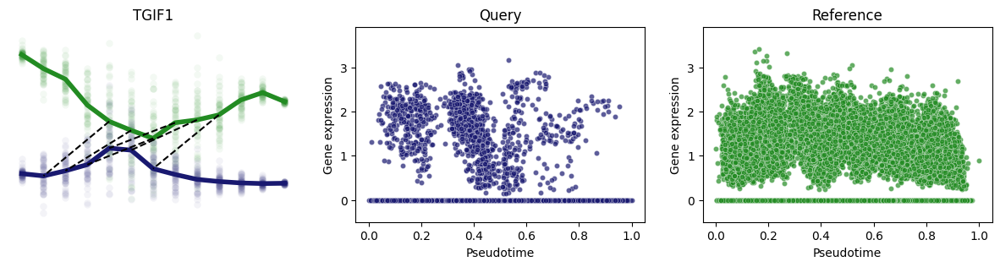

In [44]:
VisualUtils.plotTimeSeries('TGIF1', aligner)

Compute distance matrix
- using levenshtein distance metric
Experimental mode: exploring different thresholds


 77%|███████▋  | 76/99 [00:26<00:08,  2.87it/s]


-- Cluster diagnostic plots
Potential candidates for distance threshold: a locally optimal thresholds that gives a good trade-off between high mean Silhouette score and low number of clusters 


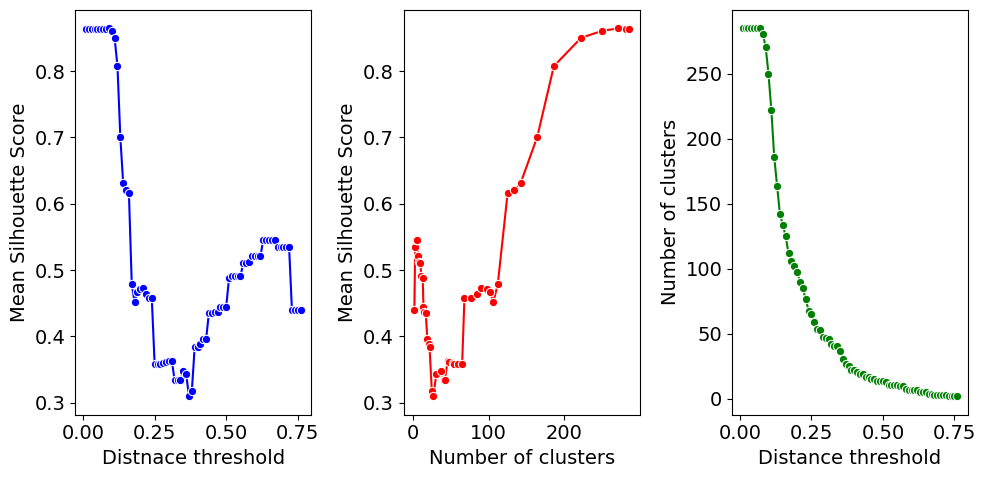

In [59]:
df = ClusterUtils.run_clustering(aligner, metric='levenshtein', experiment_mode=True) 

In [68]:
df[df['Distance threshold'] > 0.39] 

,Distance threshold,Mean Silhouette Score,Number of clusters
30,0.31,0.362957,46.0
31,0.32,0.333310,42.0
32,0.33,0.333516,41.0
33,0.34,0.333516,41.0
34,0.35,0.347097,37.0
35,0.36,0.343706,31.0
36,0.37,0.309404,27.0
37,0.38,0.317171,25.0
38,0.39,0.384154,22.0
39,0.40,0.384154,22.0


In [36]:
ClusterUtils.run_clustering(aligner, metric='levenshtein', DIST_THRESHOLD=0.35) 

Compute distance matrix
- using levenshtein distance metric
run agglomerative clustering | distance threshold = 0.35
silhouette_score:  0.417450915398895


Cluster ID | Number of genes in the cluster


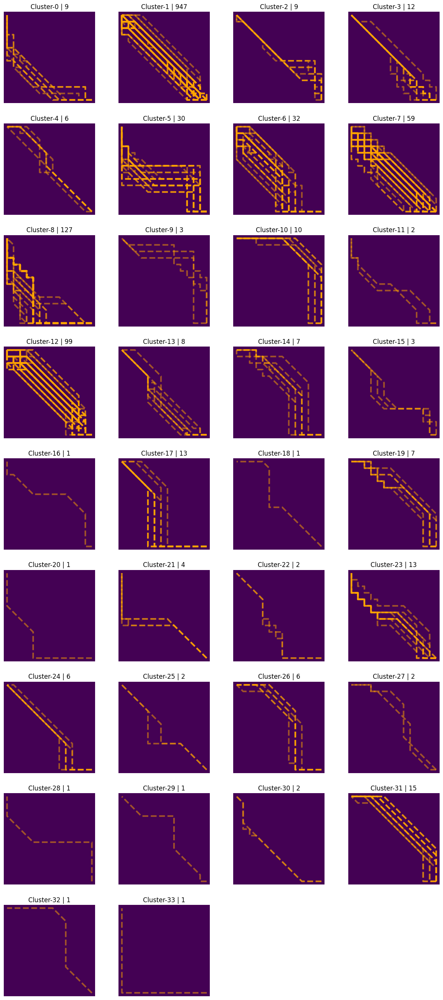

In [37]:
ClusterUtils.visualise_clusters(aligner,n_cols = 4, figsize= (10,6))

In [5]:
import pickle
pickle.dump(aligner, open('aligner_TF.pkl', 'wb')) 

NameError: name 'aligner' is not defined

In [68]:
import pickle
pickle.dump(aligner_hvgs, open('../../GOOGLE_DRIVE_MOUNT/G2G_Analysis/Sid/Revision_Aug2024_G2G_Analysis/Aligner_objects/aligner_hvgs', 'wb')) 

In [38]:
ClusterUtils.print_cluster_average_alignments(aligner)

cluster:  0 IIIDIDIDIIMMMMMWWMWD ( 9 genes)
cluster:  1 MMMMMMMMMMMMID ( 947 genes)
cluster:  2 MMMMMMMMWWWIWWIIII ( 9 genes)
cluster:  3 MMMMMMMMMIIDIDIDD ( 12 genes)
cluster:  4 DDMMMMIIMMMMMMM ( 6 genes)
cluster:  5 IIIDIDIDMWMMWWWIWIIIIDD ( 30 genes)
cluster:  6 IIIDMMMMMMIIIIDDDDDD ( 32 genes)
cluster:  7 IIIDIDIDDMMMMMMMMD ( 59 genes)
cluster:  8 IIIDIDIDIDIIIIIIIDDDDDDDDD ( 127 genes)
cluster:  9 MMDWWWWMWWWIIDIDIIIIIII ( 3 genes)
cluster:  10 IIDDDDDDDMMMMMMVVVVV ( 10 genes)
cluster:  11 IIIDIIIIIMMMIIDDDDDDDDD ( 2 genes)
cluster:  12 IIDDMMMMMMMMMIIDD ( 99 genes)
cluster:  13 MMMMIIMMMMMMMDD ( 8 genes)
cluster:  14 IIIDIDDDDDMMMMIIIIIDDD ( 7 genes)
cluster:  15 MMMMVVDDIMWMWWIDIIID ( 3 genes)
cluster:  16 IDMMMMMWWWWMMIIIIID ( 1 genes)
cluster:  17 MMMMMVVVVVVVVDDDDDDDD ( 13 genes)
cluster:  18 IIDDDDMVVVVMMMMWMWM ( 1 genes)
cluster:  19 IIIDIDDDDDDMMMMMIIIID ( 7 genes)
cluster:  20 IIIIIIMVMMMVVDDDDDDDDD ( 1 genes)
cluster:  21 IIIDIDIDIMMMMMWWMWM ( 4 genes)
cluster:  22 MMMM

In [90]:
pathway_df = PathwayAnalyser.run_overrepresentation_analysis(aligner.gene_clusters[0]) 
pathway_df.head(5)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes


In [92]:
np.asarray(aligner.gene_clusters[0])

array(['ARID3A', 'ARNTL', 'BNC1', 'DRAP1', 'EN2', 'FEZF2', 'FOXH1',
       'GLIS2', 'GLIS3', 'KLF1', 'MEF2D', 'MESP1', 'NFKB2', 'NPAS4',
       'PAX6', 'REPIN1', 'RUNX3', 'SNAI3', 'TCF24', 'TP53', 'XBP1',
       'ZNF560', 'ZNF581', 'ZNF653', 'ZNF705E', 'ZNF727'], dtype='<U7')

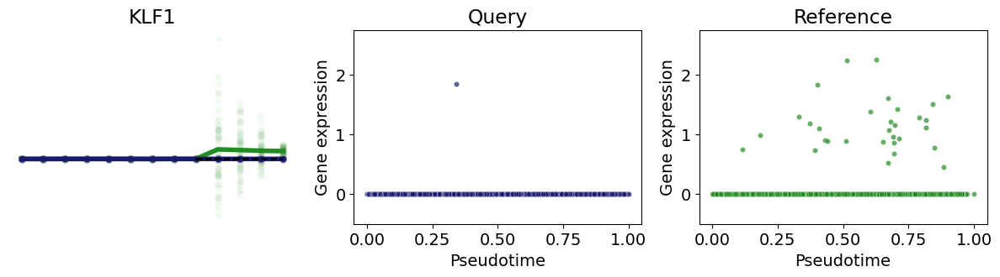

In [96]:
for g in aligner.gene_clusters[30]:
    VisualUtils.plotTimeSeries('KLF1', aligner)
    break

In [39]:
len(hvg_genes)

699

In [40]:
aligner_hvgs = Main.RefQueryAligner(adata_ref, adata_query, hvg_genes, n_bins) #
aligner_hvgs.align_all_pairs() 

Genes2Genes (v0.2.0)
Dynamic programming alignment of gene pseudotime trajectories using a bayesian information-theoretic framework
Interpolator initialization completed
Aligner initialised to align trajectories of 55659 reference cells & 20179 query cells in terms of 699 genes
Running gene-level alignment: 🧬


100%|██████████| 699/699 [04:30<00:00,  2.58it/s]

Alignment completed! ✅


Average Alignment:  IIIDIDDMMMMMMMMIDD (cell-level)
% similarity: 44.44


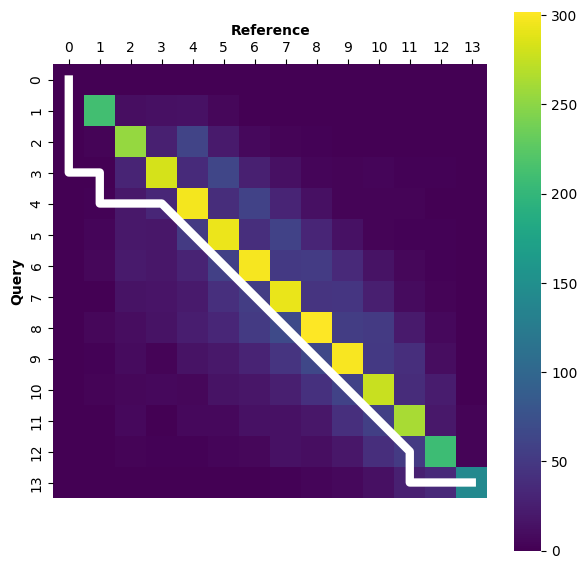

In [42]:
aligner_hvgs.get_aggregate_alignment()

In [43]:
len(np.intersect1d(hvg_genes, human_TFs)) 

55

Mean alignment similarity percentage (matched %): 
53.28000000000001 %


,Gene,alignment_similarity_percentage,opt_alignment_cost,l2fc,color,abs_l2fc
685,WFDC2,0.0,67.468115,7.961677,red,7.961677
297,HOXA10,0.0,67.468115,7.362309,red,7.362309
370,LIMCH1,0.0,67.468115,7.145821,red,7.145821
84,BEX2,0.0,67.468115,6.345318,red,6.345318
590,SLC40A1,0.0,67.468115,6.12841,red,6.12841
...,...,...,...,...,...,...
697,ZSWIM1,1.0,4.248906,0.287325,green,0.287325
187,DISP2,1.0,9.967389,-0.24097,green,0.24097
502,PLP1,1.0,4.937377,0.115169,green,0.115169
589,SLC39A8,1.0,5.399582,0.075898,green,0.075898


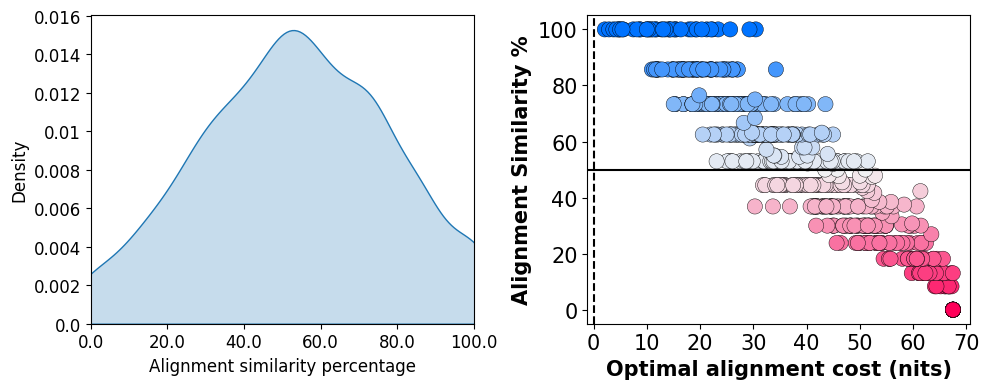

In [44]:
df = aligner_hvgs.get_stat_df() # ordered genes according to alignment similarity statistics 
df

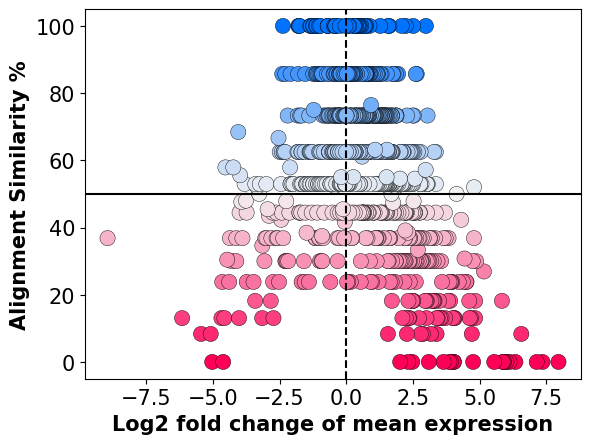

In [45]:


VisualUtils.plot_alignmentSim_vs_l2fc(df)



In [46]:
threshold_similarity = 0.3 
topDEgenes = df[list(df['alignment_similarity_percentage'] <=threshold_similarity)]['Gene']
# Calling wrapper function for GSEAPy enrichr inferface
pathway_df = PathwayAnalyser.run_overrepresentation_analysis(topDEgenes) 
pathway_df.head(5)


,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,-log10 Adjusted P-value,-log10 FDR q-val
0,MSigDB_Hallmark_2020,TNF-alpha Signaling via NF-kB,21/200,5.786781e-18,2.141109e-16,0,0,17.089385,678.294038,PPP1R15A;KLF10;EGR1;EGR2;BTG2;SERPINE1;KLF4;IC...,15.669361,15.669361
1,MSigDB_Hallmark_2020,Epithelial Mesenchymal Transition,15/200,5.162198e-11,9.550067e-10,0,0,11.304773,267.776985,TAGLN;TNFRSF12A;NTM;SERPINE1;COL12A1;HTRA1;THB...,9.019994,9.019994
2,MSigDB_Hallmark_2020,Hypoxia,12/200,5.740777e-08,7.080291e-07,0,0,8.712766,145.268698,PPP1R15A;CDKN1C;ZFP36;LOX;CITED2;SDC2;CAV1;SER...,6.149949,6.149949
3,MSigDB_Hallmark_2020,TGF-beta Signaling,7/54,1.998224e-07,1.848357e-06,0,0,19.788519,305.254468,CDKN1C;KLF10;PPP1R15A;ID2;SERPINE1;NOG;LTBP2,5.733214,5.733214
4,MSigDB_Hallmark_2020,UV Response Up,10/158,4.642536e-07,3.435477e-06,0,0,9.115143,132.924618,NFKBIA;PTPRD;CDKN1C;NR4A1;BTG2;IRF1;FOSB;ATF3;...,5.464013,5.464013


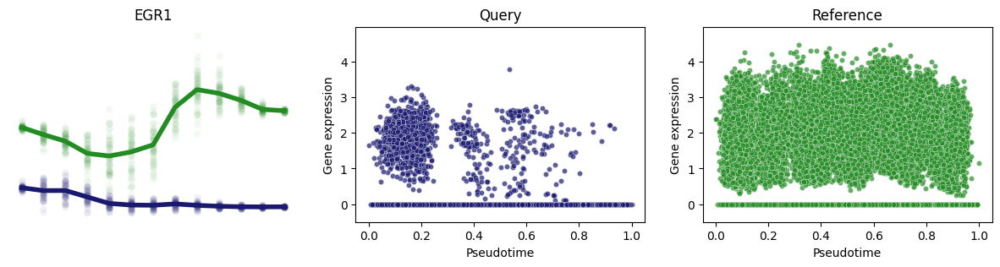

In [47]:
VisualUtils.plotTimeSeries('EGR1', aligner_hvgs)

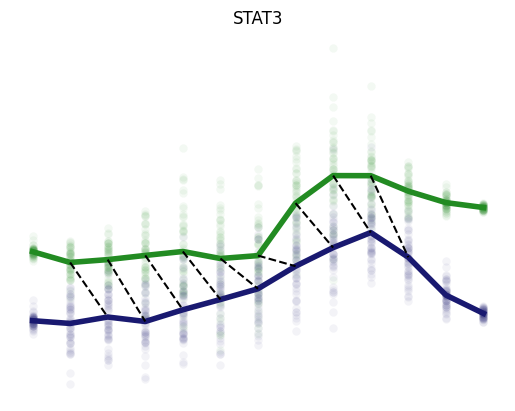

In [72]:
VisualUtils.plotTimeSeriesAlignment('STAT3', aligner)

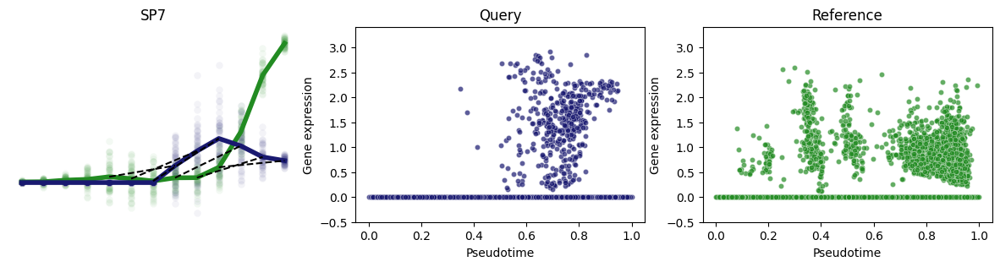

In [48]:
#VisualUtils.plotTimeSeries('STAT3', aligner)

VisualUtils.plotTimeSeries('SP7', aligner)

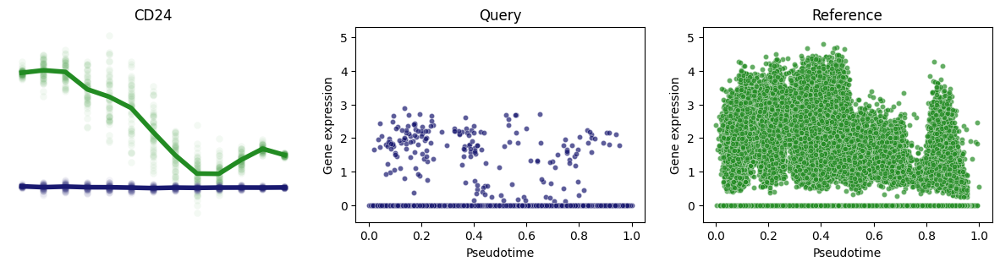

In [71]:
#VisualUtils.plotTimeSeries('STAT3', aligner)

VisualUtils.plotTimeSeries('CD24', aligner_hvgs)

In [50]:
#aligner_hvgs.show_ordered_alignments() 

Average Alignment:  IIIDIDIDIDIIIIIIIIIDDDDDDDDDDD (cell-level)
% similarity: 0.0


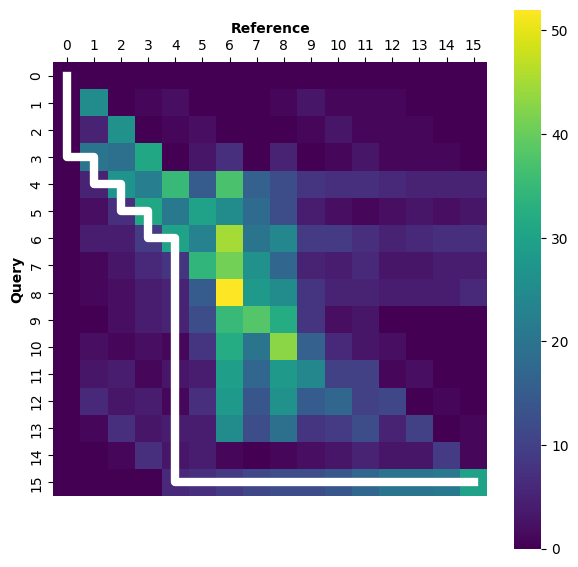

In [233]:
aligner_hvgs.get_aggregate_alignment() #previous one with old in vivo --- IGNORE!!!!

Mean alignment similarity percentage (matched %): 
21.959999999999997 %


,Gene,alignment_similarity_percentage,opt_alignment_cost,l2fc,color,abs_l2fc
55,CARMN,0.0,76.678455,-8.837453,red,8.837453
9,ACTA2,0.0,76.678455,-8.284714,red,8.284714
132,GALNT1,0.0,76.678455,-8.020046,red,8.020046
317,SMURF2,0.0,76.678455,-7.985638,red,7.985638
218,NDRG1,0.0,76.678455,-7.943228,red,7.943228
...,...,...,...,...,...,...
44,BST2,0.7895,16.132242,-4.078124,green,4.078124
237,OLFM2,0.7895,26.836959,-2.472936,green,2.472936
224,NGFR,0.7895,16.614865,-1.550974,green,1.550974
63,CERS4,0.7895,16.160661,-1.357902,green,1.357902


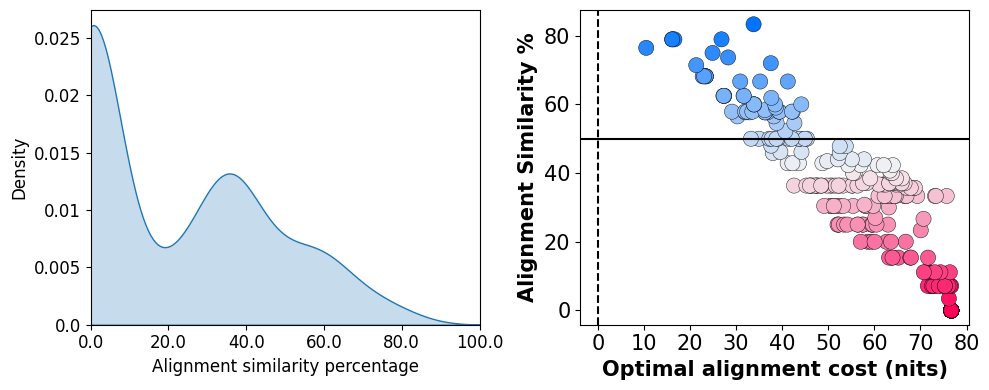

In [234]:
 #previous one with old in vivo --- IGNORE!!!!
df = aligner_hvgs.get_stat_df() # ordered genes according to alignment similarity statistics 
df

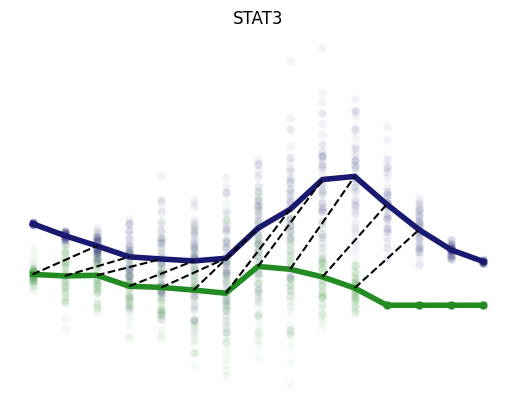

In [235]:
 #previous one with old in vivo --- IGNORE!!!!
VisualUtils.plotTimeSeriesAlignment('STAT3', aligner)

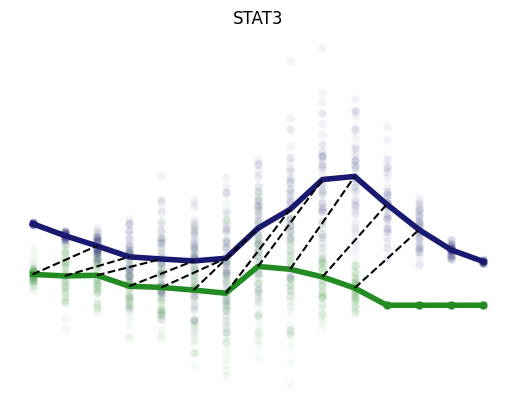

In [236]:
 #previous one with old in vivo --- IGNORE!!!!
VisualUtils.plotTimeSeriesAlignment('STAT3', aligner)

# Genes to test 

In [51]:
len(genes2test) 

28

In [52]:
aligner_genes2test = Main.RefQueryAligner(adata_ref, adata_query, genes2test, n_bins) #
aligner_genes2test.align_all_pairs() 

Genes2Genes (v0.2.0)
Dynamic programming alignment of gene pseudotime trajectories using a bayesian information-theoretic framework
Interpolator initialization completed
Aligner initialised to align trajectories of 55659 reference cells & 20179 query cells in terms of 28 genes
Running gene-level alignment: 🧬


100%|██████████| 28/28 [00:11<00:00,  2.54it/s]

Alignment completed! ✅


Average Alignment:  IIIDIDIDIDIMMMMIIDDDDD (cell-level)
% similarity: 18.18


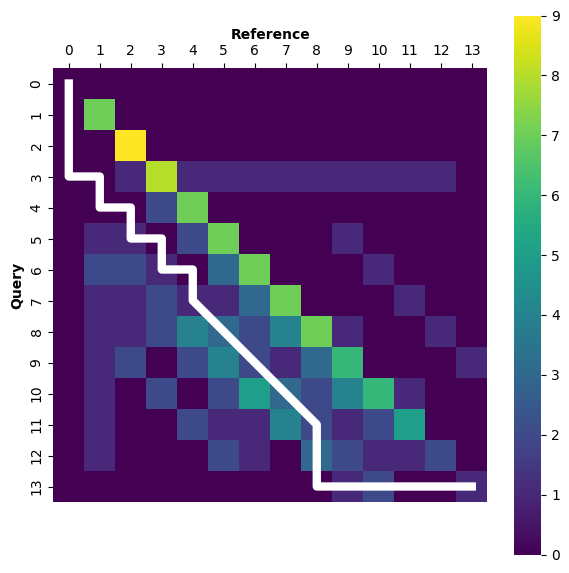

In [69]:
aligner_genes2test.get_aggregate_alignment() 

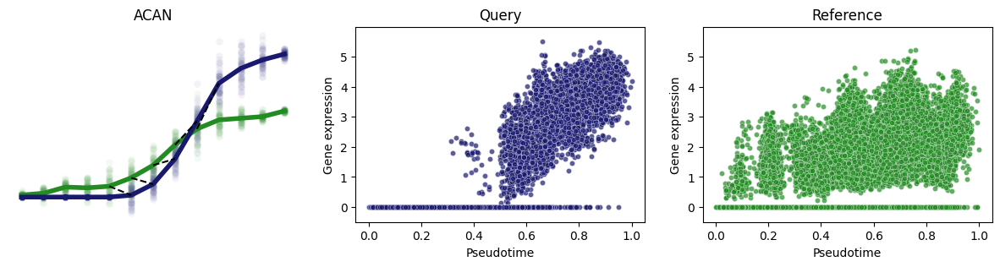

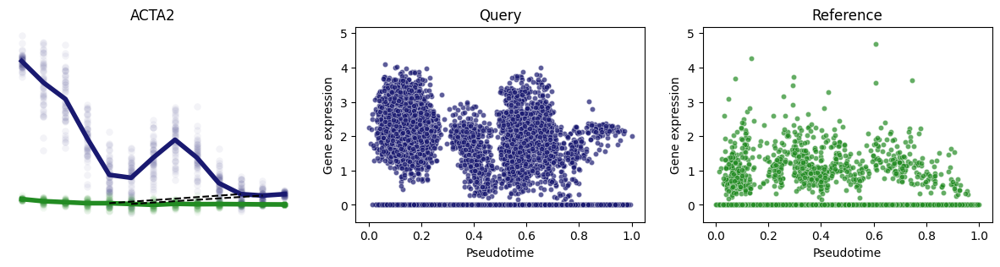

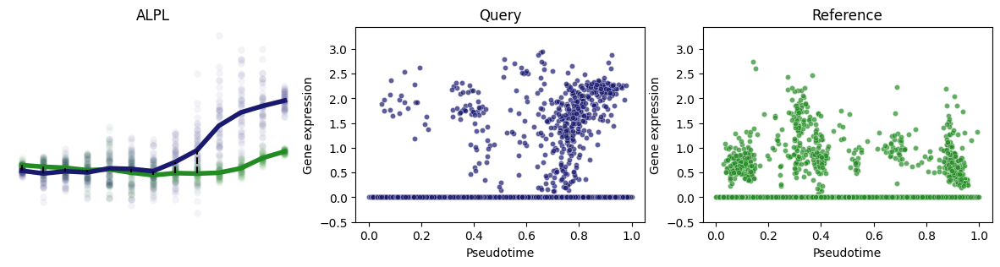

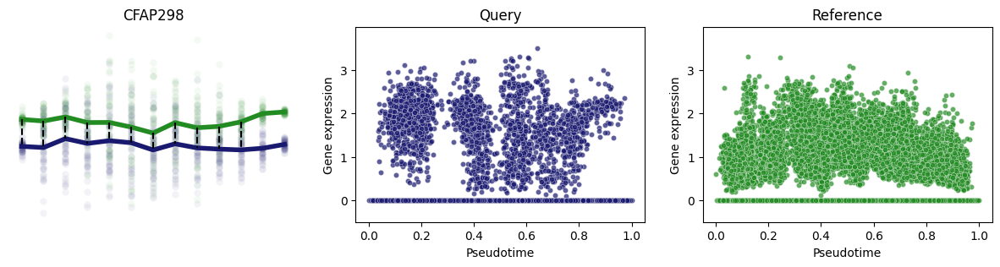

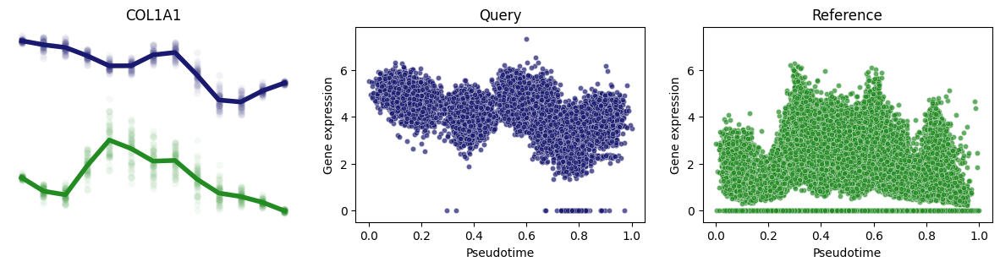

...

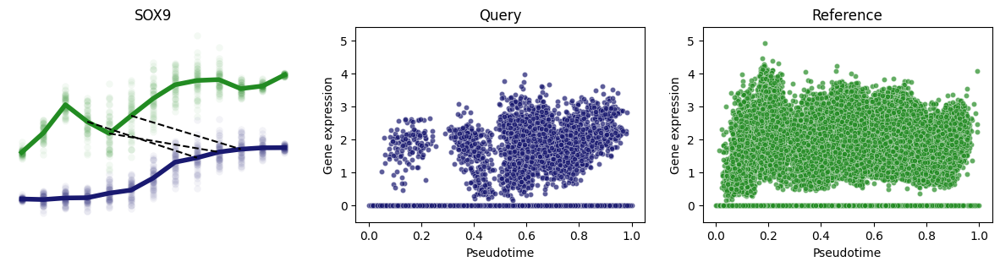

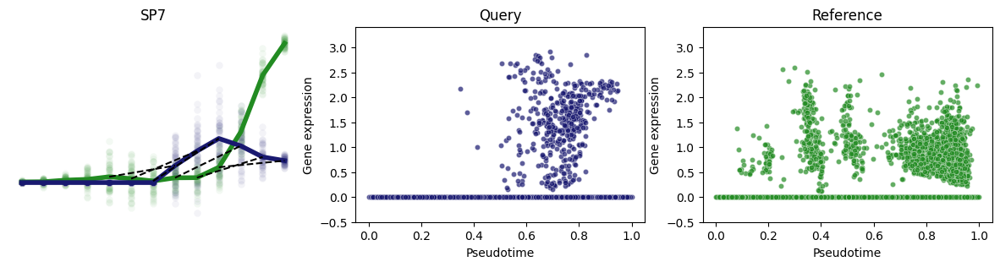

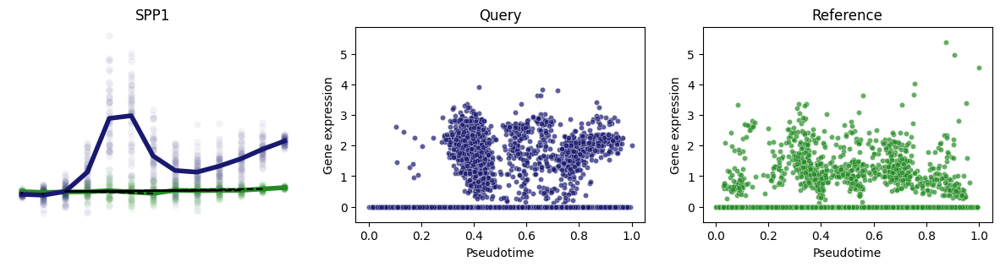

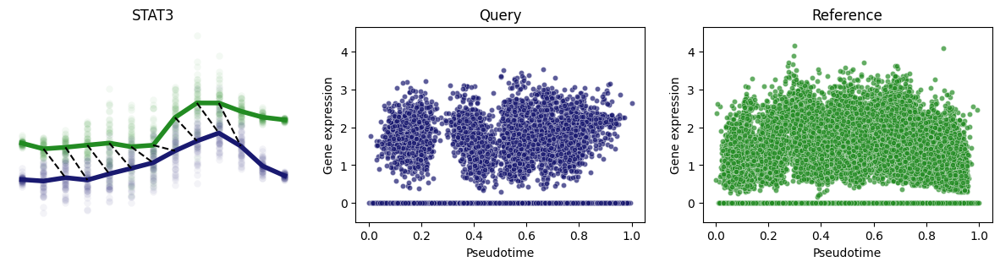

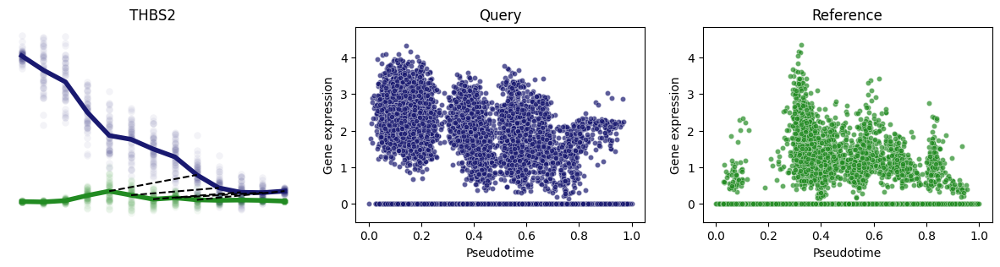

In [70]:
for gene in genes2test:
    VisualUtils.plotTimeSeries(gene, aligner_genes2test)

# ATTIC

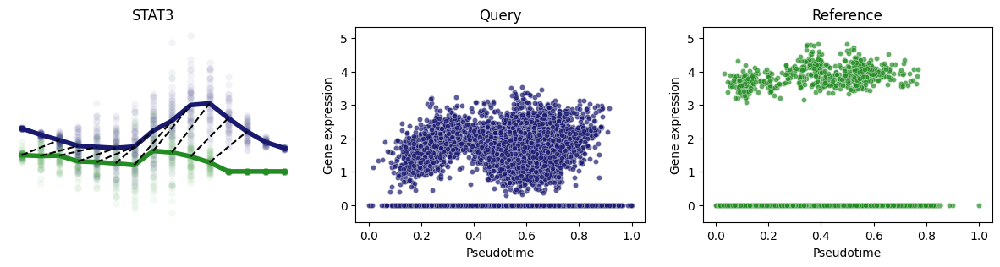

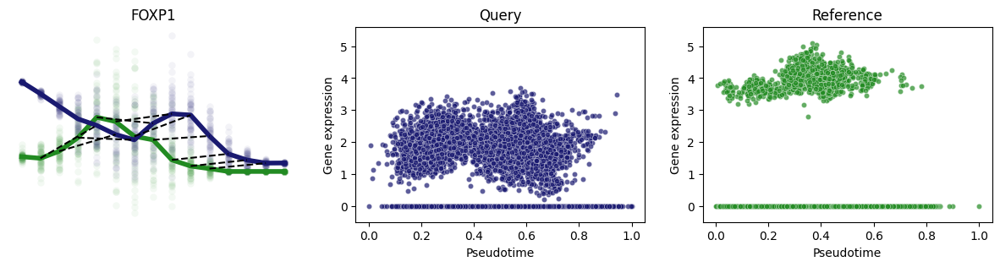

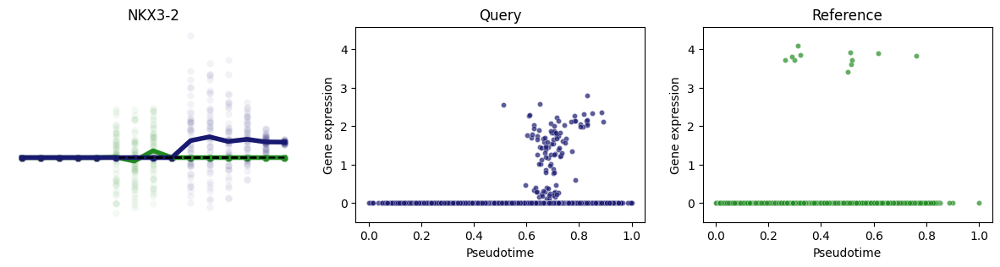

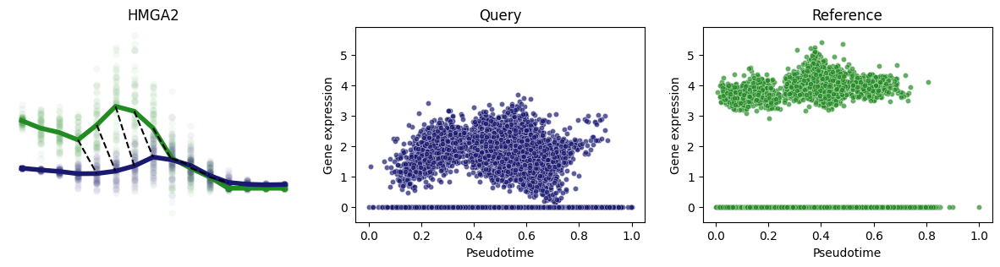

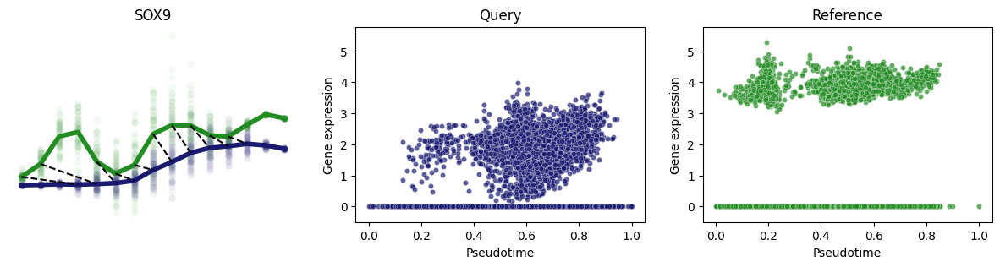

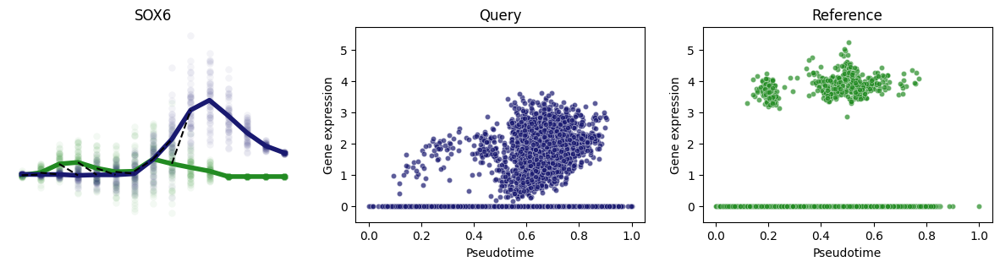

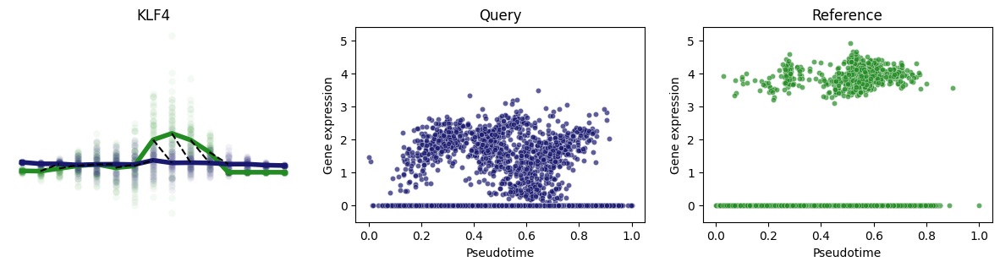

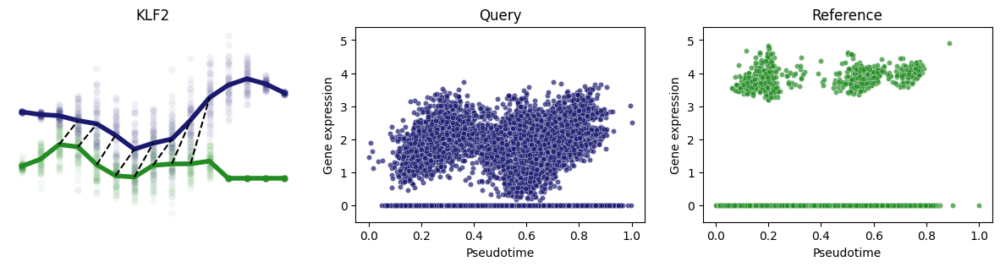

In [240]:
for gene in a:
    VisualUtils.plotTimeSeries(gene, aligner_genes2test)

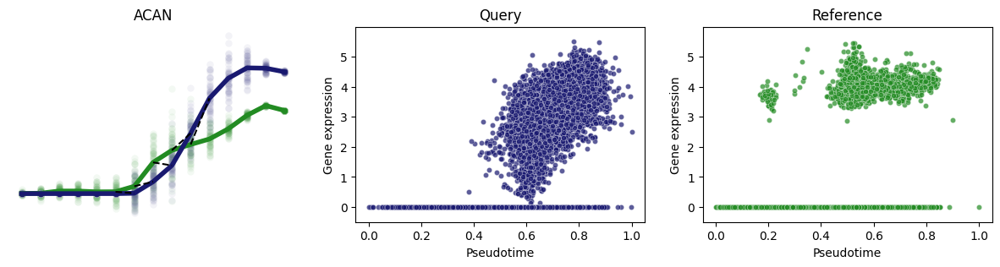

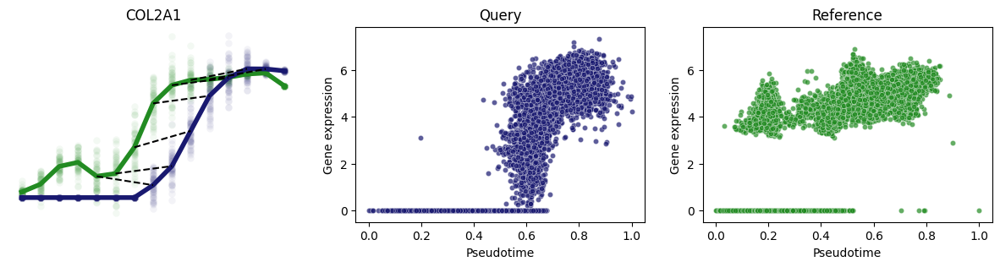

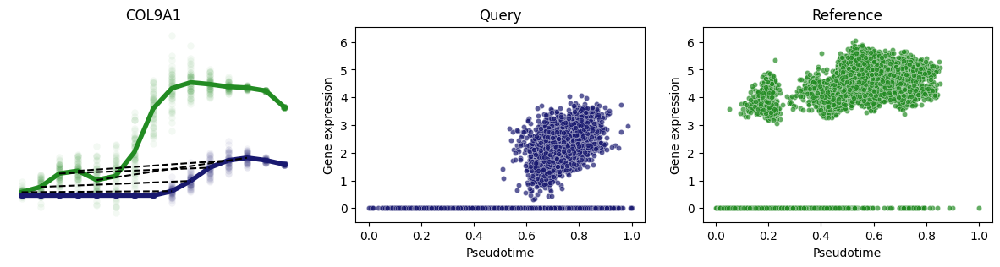

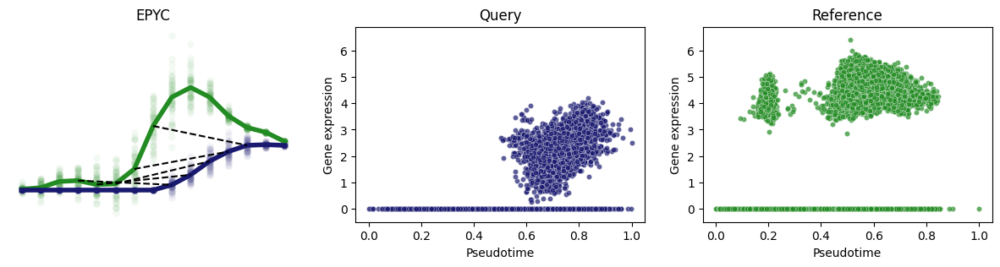

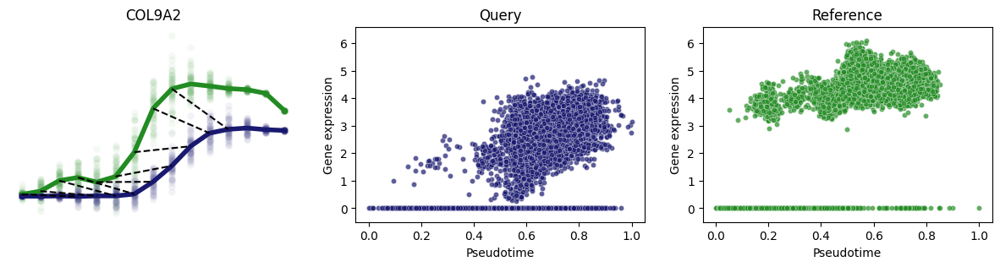

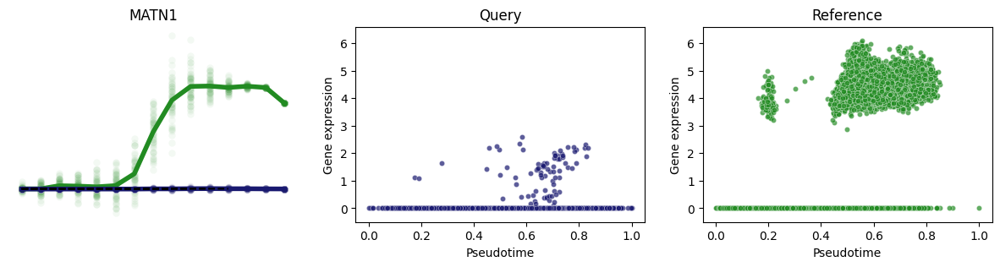

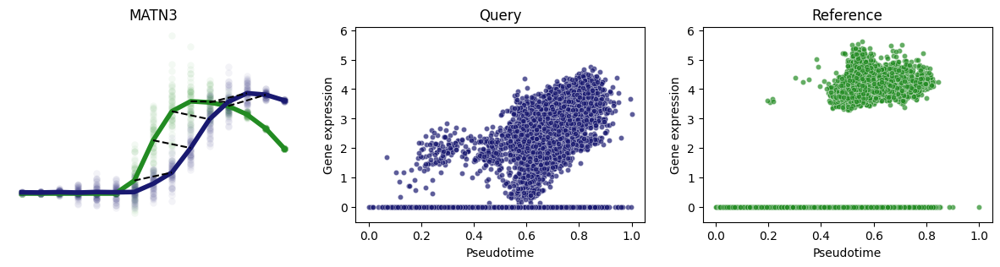

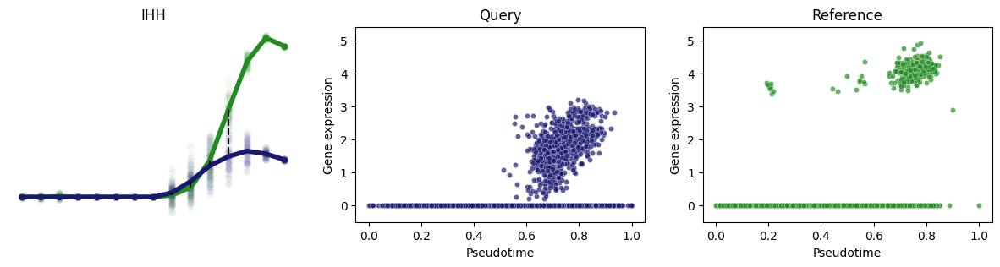

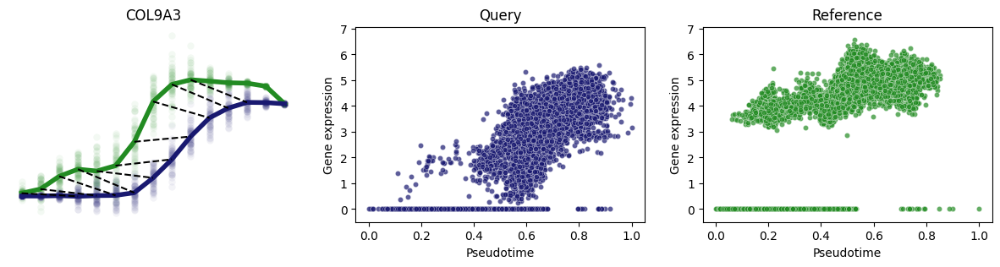

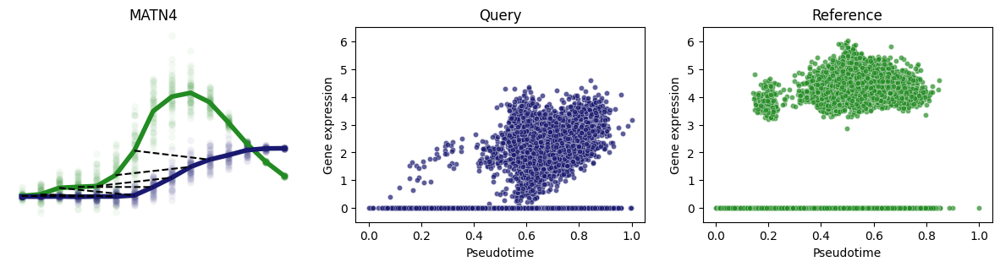

In [241]:
for gene in b:
    VisualUtils.plotTimeSeries(gene, aligner_genes2test)

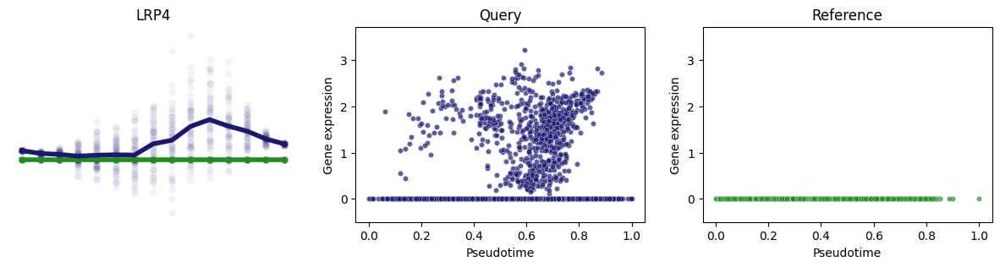

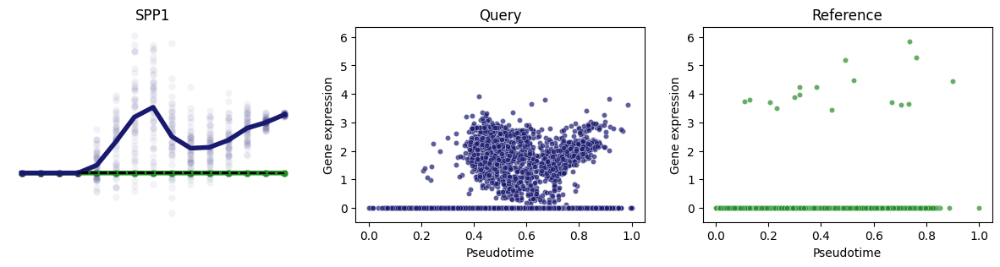

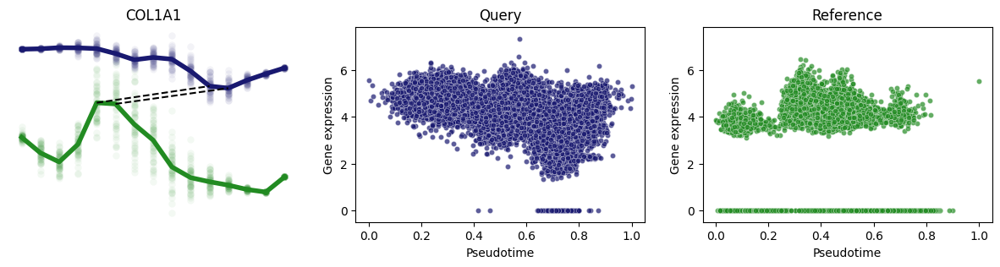

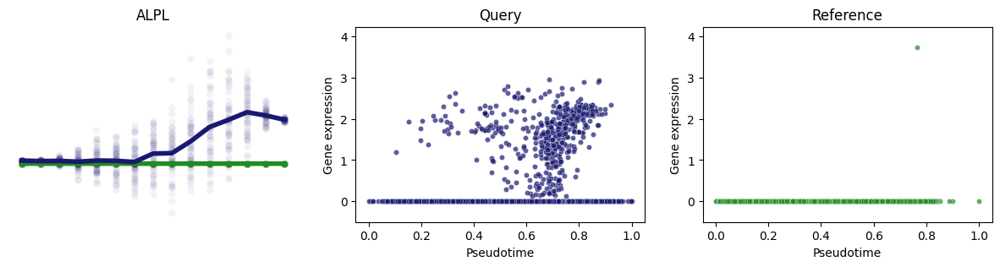

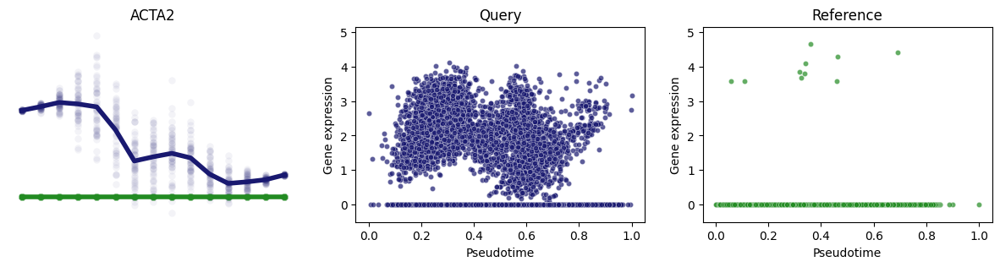

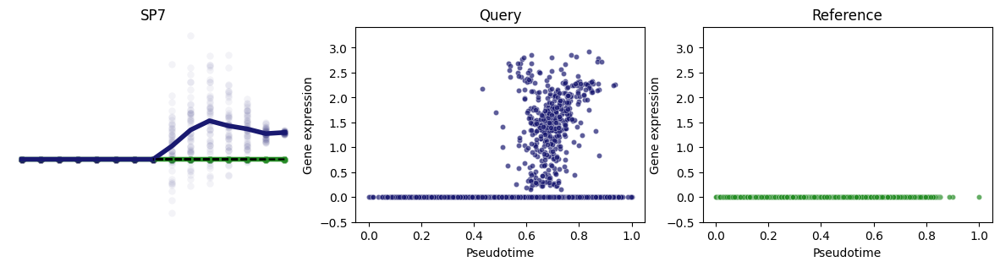

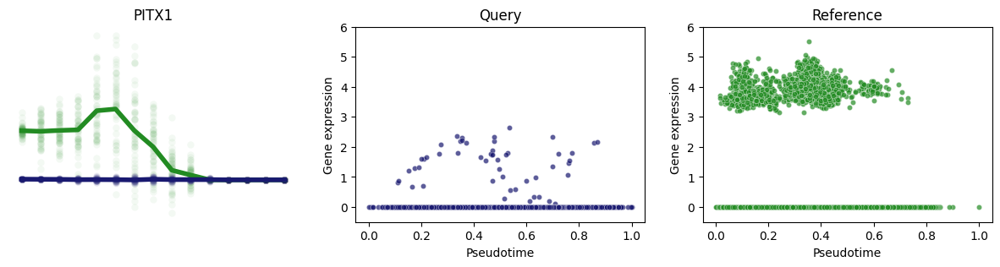

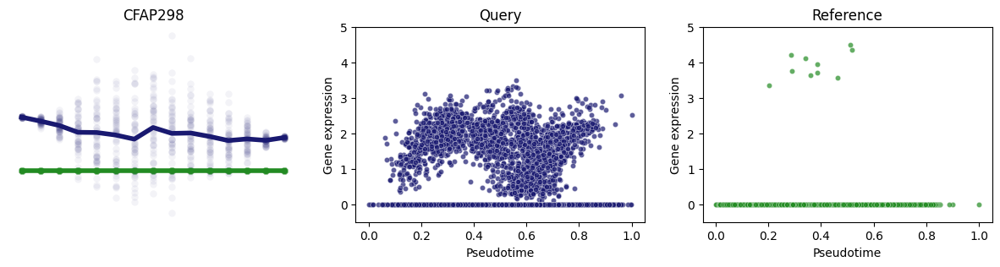

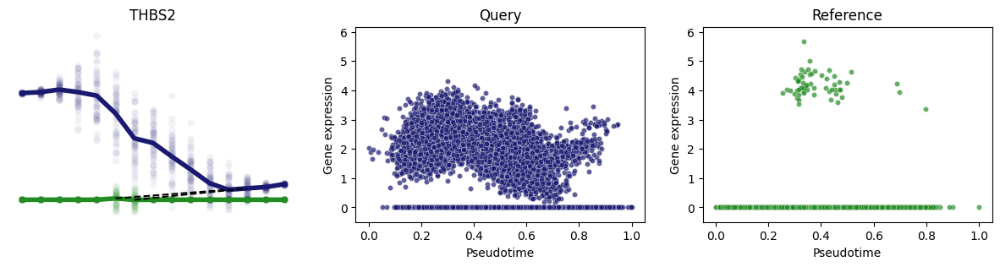

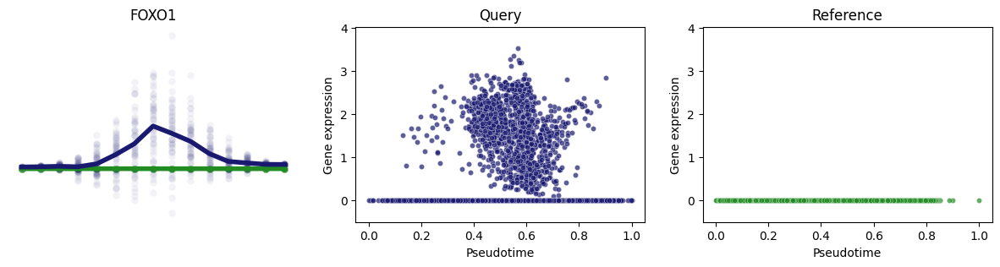

In [244]:
c = ['LRP4', 'SPP1', 'COL1A1', 'ALPL', 'ACTA2', 'SP7', 'PITX1', 'CFAP298','THBS2','FOXO1']
for gene in c:
    VisualUtils.plotTimeSeries(gene, aligner_genes2test)

In [245]:
for gene in a:
    print(gene, aligner_genes2test.results_map[gene].alignment_str)

STAT3 IIMMMMMMMMMMMIIDDDD
FOXP1 IIIDIMMMMMMMMMMIDDDD
NKX3-2 MMMMMDDDMMMMWWWIIIIII
HMGA2 IIDIDIDMMMMMMMMIIIDDDD
SOX9 IIIMMDDMMMMMMMMIIDDD
SOX6 IMMMMMMMMMIDIDIDIIDDD
KLF4 IIDMMMMMMMMMMIIIDDDD
KLF2 IIDIDMMMMMMMMIIIIDDDDD


In [246]:
for gene in b:
    print(gene, aligner_genes2test.results_map[gene].alignment_str)

ACAN IIIDIDIDIDDMMMMMIIIIDDDDD
COL2A1 IIIDIDIDIDIMMMMMMMIDDDD
COL9A1 IIIIIIIIMMMMMIIDDDDDDDDDD
EPYC IIIIIDIDIDIMMMMMIIDDDDDDD
COL9A2 IIIMMMMMMMMMIIIDDDDDD
MATN1 IIIIIDIIVVVVVIIIDDDDDDDDDDDDDD
MATN3 IIIDIDIDIDIIDDMMMMMMIDDD
IHH IDIDIDMMMMMMMMMIIIDDD
COL9A3 IIIMMMMMMMMMMIIDDDDD
MATN4 IIIIMMMMMMMIIDIIDDDDDDD


In [247]:
for gene in c:
    print(gene, aligner_genes2test.results_map[gene].alignment_str)

LRP4 IIIDIDIDIDIIIIIIIIIDDDDDDDDDDD
SPP1 MMMMWWWWWWWWWWWIIIIIIIIIII
COL1A1 IIIDIDIDIDIIIIMMIIIDDDDDDDDD
ALPL IIIDIDIDIDIIIIIIIIIDDDDDDDDDDD
ACTA2 IIIDIDIDIDIIIIIIIIIDDDDDDDDDDD
SP7 MMMMMMMMWWWWWWWIIIIIII
PITX1 IIIDIDIDIDIIIIIDDDDDDDMMMM
CFAP298 IIIDIDIDIDIIIIIIIIIDDDDDDDDDDD
THBS2 IIIDIDIDIDIIIIIDMMIIDDDDDDDD
FOXO1 IIIDIDIDIDIIIIIIIIIDDDDDDDDDDD
